<a href="https://colab.research.google.com/github/malcolmlett/training-instrumentation-toolkit/blob/main/doc/blog-202503/neuron-death.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# An investigation of Neuron Death
_Neuron death_ occurs where a given unit produces a constant zero value for all data samples. This can easily happen for a ReLU unit because it just requires that the inputs times its weights are all less than its bias for all the data samples. On its own, a single dead neuron is not a problem. And, in fact, while most networks experience a moderate level of neuron death, it is rarely a concern.

But more than that, it's rarely observed because training curves don't reveal it unless the network is overcome with neural death and training stops working. Until you had the luck of stumbling upon this notebook or one my blogs, you've probably never seen anything that plots the rate of neuron death against the kind of models that you work with.

The academic literature has long identified several potential problems associated with ReLU activation functions, including the fact that they produce a constant for half of their response curve. For example, this was part of the motivation for the gradual transition from gaussian normalisation, to [Glorot normalization](https://proceedings.mlr.press/v9/glorot10a.html) in 2010, to [He normalization](https://arxiv.org/abs/1502.01852) in 2015. And yet neuron death was only formerly investigated from 2019, starting with the works of [Lu & Shin, (2019)](https://arxiv.org/abs/1903.06733) and [Shin & Karniadakis, (2019)](https://arxiv.org/abs/1907.09696). In training courses, neuron death is often omitted from the discussion of potential problems. However there are now quite a few blog posts available on the topic.

In this notebook, I want to illustrate what neuron death is, and the tools you can use to investigate it. I'm going to do this through the problem domain of Image Alignment. I chose this particular problem domain by accident - I had read previously about neuron death, but had not encountered it as a big problem until I attempted to do image alignment. It was the difficulty in rectifying the problems there that motivated this notebook, and the creation of the "activity plot" that is used heavily throughout.

**Preliminaries**

This notebook follows a "guide" style, but it assumes that you have some familiarity with the `training-instrumentation-toolkit`. Please see the notebooks in the following github location for an introduction:
* https://github.com/malcolmlett/training-instrumentation-toolkit/blob/main/doc/index.md

The results below were achieved while running the notebook in Google Colab with a T4 GPU.

**Blog Post**

This notebook for prepared for a Mar 2025 blog post. Link coming...

In [1]:
# Install Training Instrumentation Toolkit
# (locked to specific git revision so this notebook always works)
import os
import sys
if not os.path.isdir('training-instrumentation-toolkit'):
  !git clone https://github.com/malcolmlett/training-instrumentation-toolkit.git
  !cd training-instrumentation-toolkit && git checkout fa8a50b
sys.path.append('training-instrumentation-toolkit')

# Imports
import train_instrumentation as tinstr
import train_explainer as texpl
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.transforms as transforms

# Prefer consistent behaviour
tf.config.experimental.enable_op_determinism()

Cloning into 'training-instrumentation-toolkit'...
remote: Enumerating objects: 1448, done.
remote: Counting objects: 100% (209/209), done.
remote: Compressing objects: 100% (173/173), done.
remote: Total 1448 (delta 119), reused 75 (delta 34), pack-reused 1239 (from 1)
Receiving objects: 100% (1448/1448), 135.64 MiB | 22.91 MiB/s, done.
Resolving deltas: 100% (868/868), done.
Note: switching to 'fa8a50b'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at fa8a50b future improvement plans for train explainer


## Dataset Pipeline

For the image alignment problem we'll use the images from the CIFAR-10 dataset. These are RGB images with dimensions 32 x 32 px.

For each original image we'll randomly sample a 16x16 "rotated crop" from somewhere near the centre. Conceptually this works by placing a square 16x16 template somewhere over the original image, rotating it by some angle, and then mapping it onto a normal 16x16 image.

The datastructure of each sample in the dataset will be a complex tuple as follows:
```
(original_image, cropped_image), transform
```
with the following specifications:
* `original_image` - tensor of floats in range 0.0 to 1.0, with shape `(32, 32, 3)`
* `cropped_image` - tensor of floats in range 0.0 to 1.0, with shape `(32, 32, 3)`
* `transform` - 3-vector of floats containing `[dx, dy, da]` as follows:
  * `dx`, `dy` - floats in range -0.5 .. +0.5, indicating the translation of the centre of the cropped image relative to the centre of the original image, as a fraction of the original image width/height
  * `da` - float in range -1.0 .. +1.0, indicating the angle of rotation of the cropped image relative to original, as a fraction of 180 degrees.

The translation coordinates and orientation will be randomly chosen from a gaussian distribution with a mean at zero, and a small variance. Most crops will be near the image centre and only rotated a little.

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


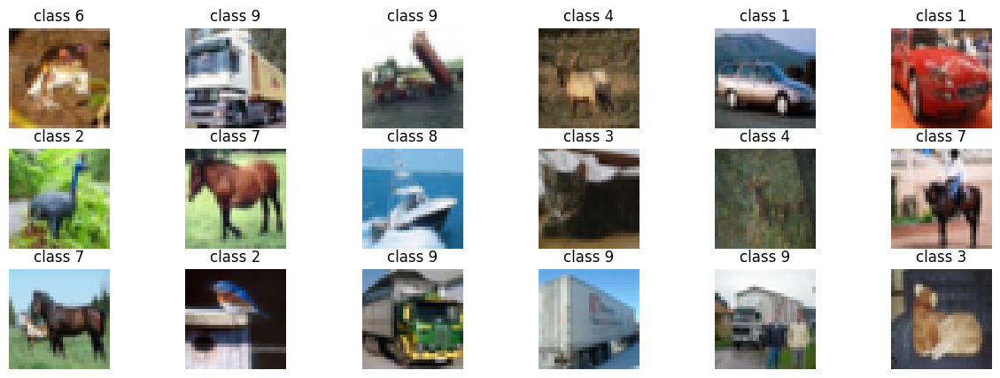

In [2]:
# Load CIFAR-10 dataset
(x_train, y_train), _ = tf.keras.datasets.cifar10.load_data()
x_train = x_train.astype('float32') / 255.0

# Plot some examples
plt.figure(figsize=(15,5))
for i in range(18):
    plt.subplot(3, 6, i + 1)
    plt.title(f"class {y_train[i][0]}")
    plt.imshow(x_train[i])
    plt.axis('off')
plt.show()

In [3]:
# main image manipulation functions
def rotated_crop(image, dx, dy, da):
    """
    Takes a 50% crop of the source image after applying a positional and angular
    offset relative to the image's centre.
    For example, (dx,dy,da) = (-0.25,0,0.5) will take a crop centred one quarter
    of the image width to the left from the source image centre and rotated
    45 degrees (50% of 180 in whichever direction the positive direction happens
    to take).
    Args:
      image: source image
      dx: float in range -0.5 .. +0.5 (fraction of width)
      dy: float in range -0.5 .. +0.5 (fraction of height)
      da: float in range -1.0 .. +1.0 (fraction of radians)
    Returns:
      cropped image
    """
    # Image dimensions
    img_height, img_width = image.shape[0], image.shape[1]
    img_centre_x = img_width // 2
    img_centre_y = img_height // 2
    crop_size = img_height // 2  # 50% of original size (16x16 for CIFAR-10)
    crop_centre_x = crop_size // 2
    crop_centre_y = crop_size // 2

    # Step 1: Rotate crop window about its top-left corner
    # - assuming crop-mid is at (x,y)=(8,8)
    # - net result is that the crop-mid will move to crop_mid' = tf.linalg.matvec(R, crop_mid)
    R = tf.stack([
        [tf.cos(da * np.pi), -tf.sin(da * np.pi), 0],
        [tf.sin(da * np.pi), tf.cos(da * np.pi), 0],
        [0.0, 0.0, 1.0]
    ])
    R_neg = tf.stack([
        [tf.cos(-da * np.pi), -tf.sin(-da * np.pi), 0],
        [tf.sin(-da * np.pi), tf.cos(-da * np.pi), 0],
        [0.0, 0.0, 1.0]
    ])

    # Step 2a: Calculate crop-mid after rotation
    crop_mid = [crop_centre_x, crop_centre_y, 1.]
    crop_mid = tf.linalg.matvec(R, crop_mid)

    # Step 2b: Translate rotated location of crop-mid back to it's original position
    Tv = [crop_centre_x - crop_mid[0], crop_centre_y - crop_mid[1], 1.]

    # Step 2c: translate crop-mid to target location on source image
    tx = img_centre_x + dx * img_width - crop_centre_x
    ty = img_centre_y + dy * img_height - crop_centre_y
    Tv = [Tv[0] + tx, Tv[1] + ty, 1.]

    # Step 2d: reverse rotation impact before applying
    # - we'll apply the translation first, so it's ultimate effect is then rotated,
    #   so we counteract that effect by pre-rotating in the opposite direction
    Tv = tf.linalg.matvec(R_neg, Tv)
    T = tf.stack([
        [1.0, 0.0, Tv[0]],
        [0.0, 1.0, Tv[1]],
        [0.0, 0.0, 1.0]
    ])

    # combine transformations: R * T
    # - technically this is applying T first, and then R
    # - has effect of rotating crop window by R, and then translating by R(T)
    h_matrix = tf.linalg.matmul(R, T)

    # Flatten to 8 parameters (last is 1)
    h_matrix = tf.reshape(h_matrix, [-1])[:-1]

    # Apply projective transform
    rotated_crop = tf.raw_ops.ImageProjectiveTransformV3(
        images=tf.expand_dims(image, 0),  # Add batch dimension
        transforms=tf.expand_dims(h_matrix, 0),  # Add batch dimension
        output_shape=[crop_size, crop_size],
        interpolation='BILINEAR',
        fill_value=0.0,
        fill_mode='CONSTANT'
    )[0]  # Remove batch dimension

    return rotated_crop

def draw_crop_template(image, transform):
  dx, dy, da = transform
  centre_x = image.shape[1] * (0.5 + dx)
  centre_y = image.shape[0] * (0.5 + dy)
  width = image.shape[1] // 2
  height = image.shape[0] // 2
  radians = da * np.pi

  # draw a rectangle showing the outline of where the crop was taken from
  ax = plt.gca()
  rect = patches.Rectangle((centre_x - width/2, centre_y - height/2), width, height, linewidth=1, edgecolor='r', facecolor='none')
  t = transforms.Affine2D().rotate_deg_around(centre_x, centre_y, radians * 180 / np.pi)
  rect.set_transform(t + ax.transData)
  ax.add_patch(rect)

  # draw a rotated 0-degrees line to indicate the rotation.
  line_end_x = centre_x + width / 2
  line_end_y = centre_y
  rotated_endpoint = t.transform([(line_end_x, line_end_y)])[0]
  ax.plot([centre_x, rotated_endpoint[0]], [centre_y, rotated_endpoint[1]], color='r', linewidth=1)

def show_data_sample(inputs, output):
  (image, cropped) = inputs
  transform = output
  plt.figure(figsize=(10, 3))

  plt.subplot(1, 2, 1)
  plt.title("Original")
  plt.imshow(image)
  draw_crop_template(image, transform)

  plt.subplot(1, 2, 2)
  plt.title(f"Rotated Crop\n(dx, dy, angle): {transform}")
  plt.imshow(cropped)
  plt.show()

As an example, here's the `original_image` and generated `cropped_image` if our transform is `[0.0, 0.0, 0.15]`, which gives us a cropped image in the exact centre, and rotated by 0.15*180 = 27 degrees:

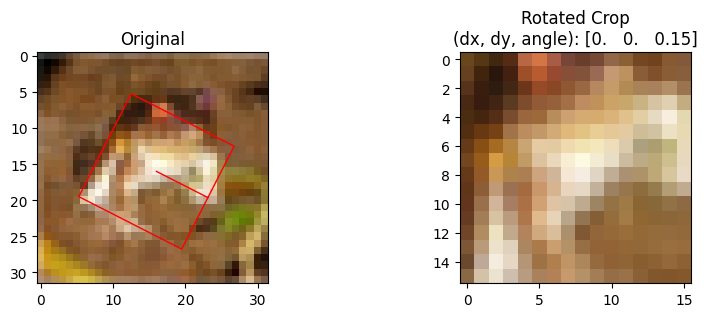

In [4]:
image = x_train[0]
transform = tf.constant(([0.0, 0.0, 0.15]))
cropped = rotated_crop(image, dx=transform[0], dy=transform[1], da=transform[2])
show_data_sample((image, cropped), transform)

Original shape: (32, 32, 32, 3)
Rotated Crop shape: (32, 16, 16, 3)
Transformation shape: (32, 3)
Total number of batches (batch-size=32): 1563


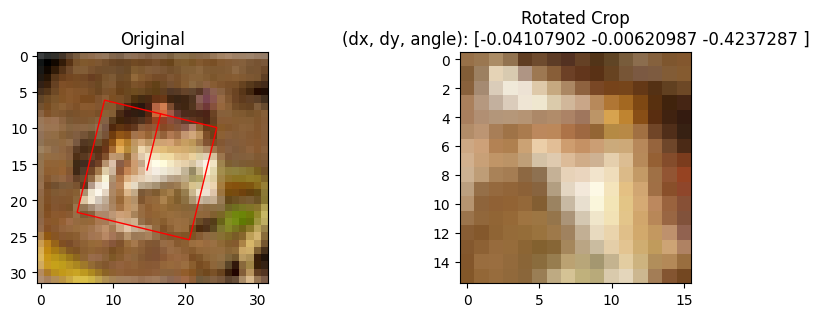

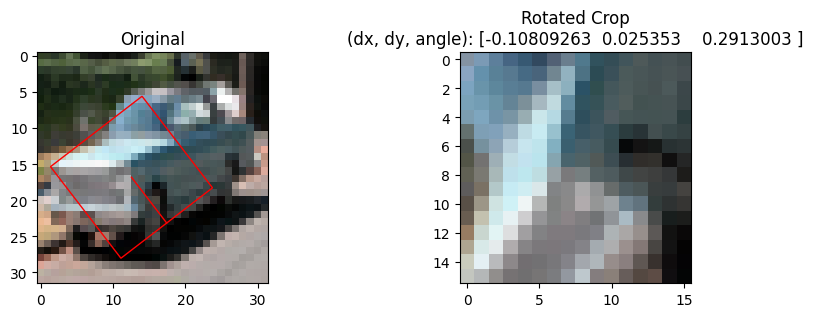

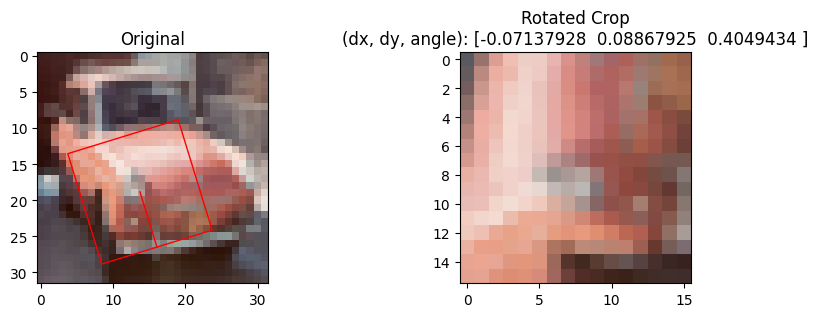

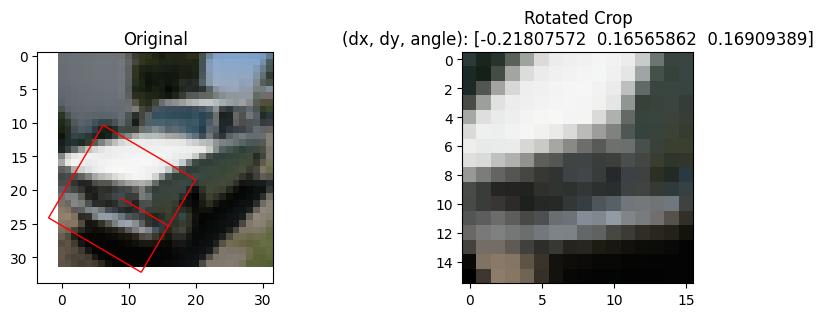

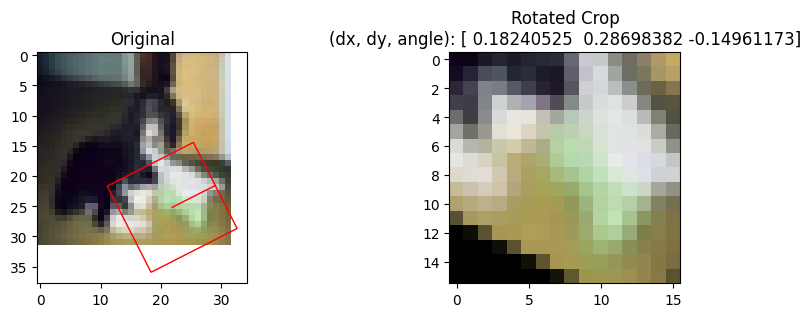

In [5]:
# pre-processing pipeline
def preprocess_image(image):
    # Generate random translation and rotation
    # - dx/dy in range -0.5..+0.5 (fraction of width/height)
    # - da    in range -1.0..+1.0 (radians)
    # - small stddev
    dx = tf.clip_by_value(tf.random.normal([], mean=0, stddev=0.5/4), -0.5, 0.5)
    dy = tf.clip_by_value(tf.random.normal([], mean=0, stddev=0.5/4), -0.5, 0.5)
    da = tf.clip_by_value(tf.random.normal([], mean=0, stddev=1.0/4), -1.0, 1.0)

    # Take rotated crop
    cropped = rotated_crop(image, dx, dy, da)

    # construct as input/output tuples
    transform = tf.stack([dx, dy, da])
    return (image, cropped), transform

def prepared_dataset():
  train_dataset = tf.data.Dataset.from_tensor_slices(x_train)
  train_dataset = train_dataset.map(
      preprocess_image,
      num_parallel_calls=tf.data.AUTOTUNE
  )
  return train_dataset

# Test and visualize
tf.keras.utils.set_random_seed(9)
train_dataset = prepared_dataset().batch(32).prefetch(tf.data.AUTOTUNE)
for (original, cropped), transform in train_dataset.take(1):
    print("Original shape:", original.shape)
    print("Rotated Crop shape:", cropped.shape)
    print("Transformation shape:", transform.shape)
print(f"Total number of batches (batch-size=32): {len(train_dataset)}")
for (original, cropped), transform in train_dataset.take(5):
    show_data_sample((original[0], cropped[0]), transform[0])

## Model
We're going to train a fairly simple Siamese-CNN for this problem. In their translated and rotated state relative to each other, the two input images are more or less independent, so we'll have two independent input arms, one for each of the two input images. Each input arm will follow a fairly typical CNN downsampling architecture that results in a low-resolution / high-feature-dimension image at the end. Then we'll concatenate the two feature sets and run a series of fully connected layers before computing the final output as a 3-vector.

The layers will exclusively use ReLU activation, except for the final output layer which will use a linear activation function as we're looking for outputs in a simple linear range.

There are a number of problems with this simplistic CNN approach for the given problem domain, as we'll shortly see. But it's a good example to illustrate the extreme of neuron death, and what can be done to alleviate the problem.

In [6]:
def baseline_conv_model():
    original_input = tf.keras.Input(shape=(32, 32, 3), name="original_image")
    crop_input = tf.keras.Input(shape=(16, 16, 3), name="crop")

    # A CNN stack for the 32x32 original image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1a')(original_input)
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_1')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2a')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_2')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3a')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_3')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4a')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_4')(x1)
    x1 = layers.Flatten(name='x1_flatten')(x1)
    x1 = layers.Dense(128, activation='relu', name='x1_dense_1')(x1)

    # Separate CNN stack for the 16x16 cropped input
    # - 16x16x3 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1a')(crop_input)
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_1')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2a')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_2')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3a')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_3')(x2)
    x2 = layers.Flatten(name='x2_flatten')(x2)
    x2 = layers.Dense(128, activation='relu', name='x2_dense_1')(x2)

    # Combined path
    # - 128 + 128 -> 256 -> 3 (dx, dy, da)
    out = layers.Concatenate(name='head_concat1')([x1, x2])
    out = layers.Dense(256, activation='relu', name='head_dense1')(out)
    out = layers.Dense(256, activation='relu', name='head_dense2')(out)
    out = layers.Dense(3, activation='linear', name='head_dense3')(out)

    return tf.keras.Model(inputs=[original_input, crop_input], outputs=out)

# Print off model summary
baseline_conv_model().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ original_image      │ (None, 32, 32, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_1a        │ (None, 32, 32, 8) │        224 │ original_image[0… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_1b        │ (None, 32, 32, 8) │        584 │ x1_conv2d_1a[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_pool2d_1         │ (None, 16, 16, 8) │          0 │ x1_conv2d_1b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ crop (InputLayer)   │ (None, 16, 16, 3) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_2a        │ (None, 16, 16,    │      1,168 │ x1_pool2d_1[0][0] │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_conv2d_1a        │ (None, 16, 16,    │        448 │ crop[0][0]        │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_2b        │ (None, 16, 16,    │      2,320 │ x1_conv2d_2a[0][… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_conv2d_1b        │ (None, 16, 16,    │      2,320 │ x2_conv2d_1a[0][… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_pool2d_2         │ (None, 8, 8, 16)  │          0 │ x1_conv2d_2b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_pool2d_1         │ (None, 8, 8, 16)  │          0 │ x2_conv2d_1b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_3a        │ (None, 8, 8, 32)  │      4,640 │ x1_pool2d_2[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_conv2d_2a        │ (None, 8, 8, 32)  │      4,640 │ x2_pool2d_1[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_conv2d_3b        │ (None, 8, 8, 32)  │      9,248 │ x1_conv2d_3a[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_conv2d_2b        │ (None, 8, 8, 32)  │      9,248 │ x2_conv2d_2a[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x1_pool2d_3         │ (None, 4, 4, 32)  │          0 │ x1_conv2d_3b[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ x2_pool2d_2         │ (None, 4, 4, 32)  │          0 │ x2_conv2d_2b[0][… │
│ (MaxPooling2D)      │                   │            │                 

 Total params: 343,835 (1.31 MB)

 Trainable params: 343,835 (1.31 MB)

 Non-trainable params: 0 (0.00 B)

First let's train the model for 50 epochs to get a feel for the basic overall trend of its learning curve...

In [6]:
# Train the model
tf.keras.utils.set_random_seed(9)
model = baseline_conv_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=[]
)
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), tinstr.HistoryStats()])

Epoch     5 - 4.63s/epoch: loss: 0.0322  
Epoch    10 - 3.28s/epoch: loss: 0.0322  
Epoch    15 - 3.15s/epoch: loss: 0.0322  
Epoch    20 - 2.75s/epoch: loss: 0.0322  
Epoch    25 - 3.34s/epoch: loss: 0.0322  
Epoch    30 - 3.62s/epoch: loss: 0.0322  
Epoch    35 - 3.46s/epoch: loss: 0.0322  
Epoch    40 - 3.19s/epoch: loss: 0.0322  
Epoch    45 - 4.38s/epoch: loss: 0.0322  
Epoch    50 - 3.17s/epoch: loss: 0.0322  
Total training time: 174.8 sec


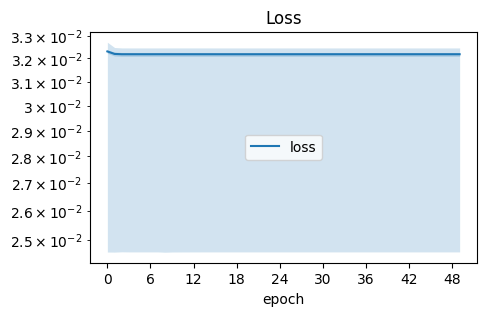

In [7]:
tinstr.plot_train_history(history)

**Commentary:**

* Notice that despite the per-step variance, the loss remains almost stagnant from epoch to epoch. The model is not learning.
* Recall also that loss is calculated as MSE on the dx, dy, and da components, and the dx/dy components are in the range -0.5 .. +0.5, as fractions of the original image width/height. So a loss of 0.03 can translate as $\sqrt{0.03}$ = 17.3% of the original width. That's a very large error.


If loss was the only tool available to you, then you'd be left guessing as to the cause. You might even think there's a bug in the loss calculation itself .... but you'd be wrong.

Let's get some more detailed and deeper analytics into the training behaviour, and see what's really going on.



## Instrumented Training
To investigate, we'll add some initial instrumentation to collect stats on the distributions of variable values (ie: the weights and biases), gradients, layer outputs, and the gradients w.r.t. those layer outputs during each epoch.

Note that instrumentation slows down training time, and we've seen that the training behaviour doesn't change much over the course of 50 epochs, so we'll just train for the first 10 epochs this time.

In [7]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = baseline_conv_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=[]
)
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=10, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.0320


Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.0318
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0318
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.0318
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0318
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.0318
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0318
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.0318
Epoch 9/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.0318
Epoch 10/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0318


First we'll get an overview...

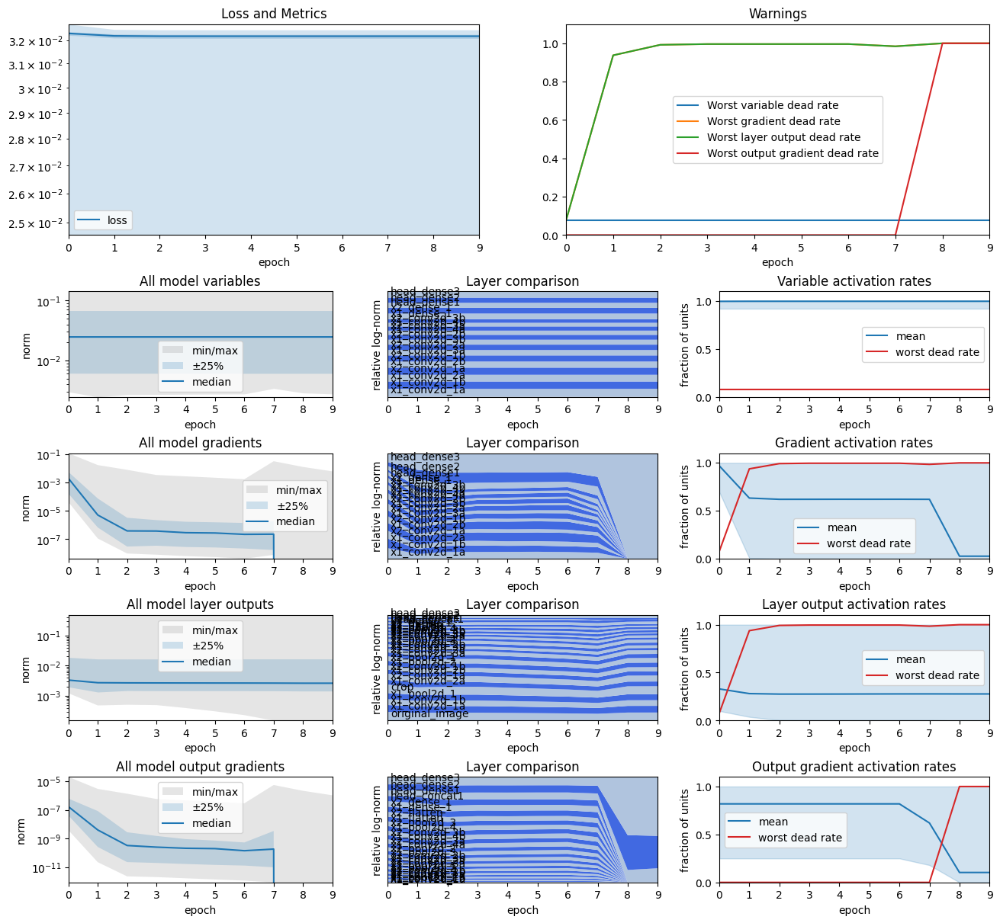

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

**Commentary**

There's something very wrong with the gradients. Let's look closer.

Rather than plotting the direct distribution of gradient values, I find it far more useful to plot something I call an "activity plot". This measures two things:
* _activation rate_ - the percentage of non-zero individual elements within the gradients for a given weight matrix
* _dead rate_ - the percentage of neuron units (or channels) that are _always_ zero for all data samples
I also sometimes calculate a related quantity for convolutional and sequence networks:
* _spatial dead rate_ - the percentage of spatial positions that are _always_ zero for all data samples and all channels

These measures can be calculated against raw weights and biases, their gradients, or the layer outputs. For now we're just looking at the gradients. Notice that activation rate treats all dimensions equally and just calculates a global stat across the whole matrix or tensor being examined, whereas the dead rate is focused on individual neuron units or channels and applies a conditional logic (it only counts a unit as dead if _all_ values are zero for all other dimensions).

I've never seen anything quite like this plot in any other literature, but I find it extremely useful.

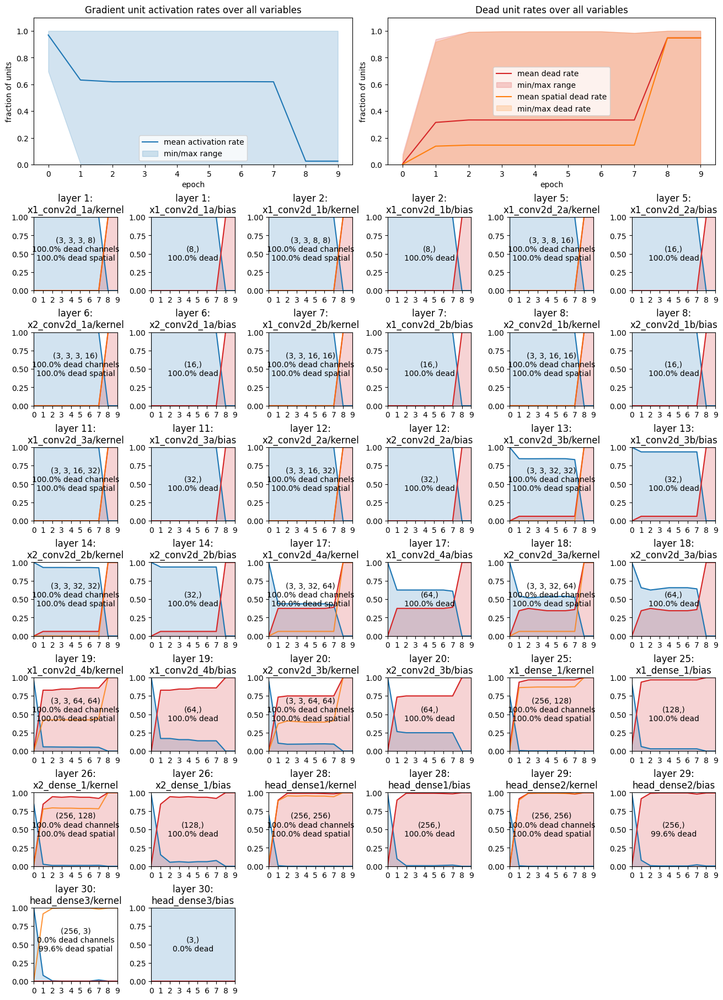

In [ ]:
tinstr.plot_activity_history(gradients)

For comparison, here's plots against the raw gradients. You can definitely see evidence of the problem, with gradients heading to -inf, but the problem is not as clear as it is in the plots above...

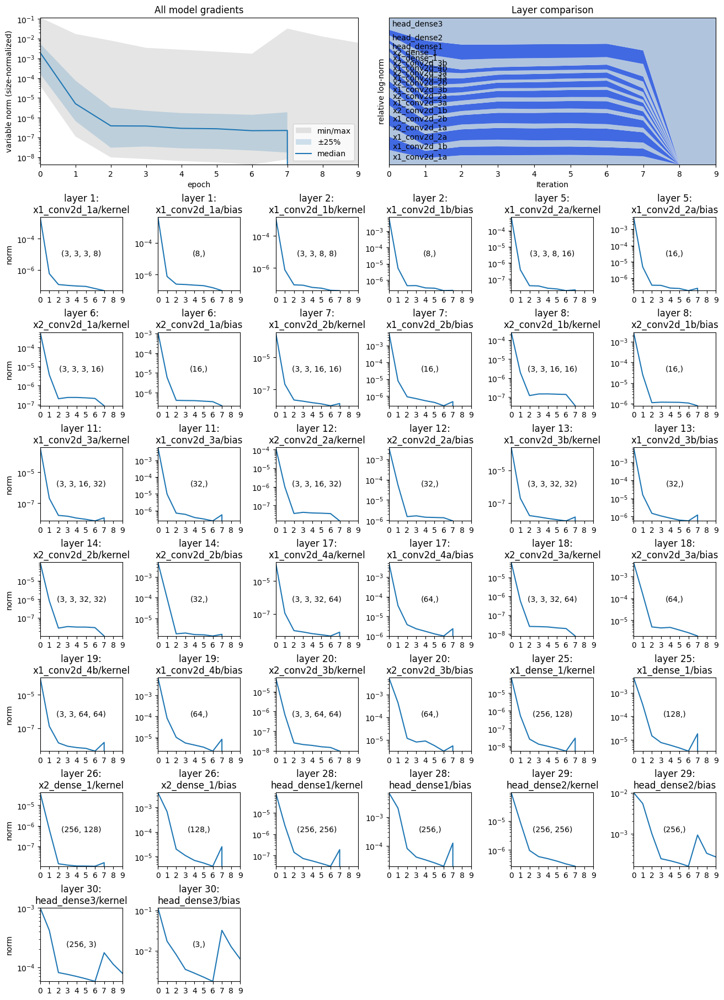

In [ ]:
tinstr.plot_value_history(gradients, show="norms")

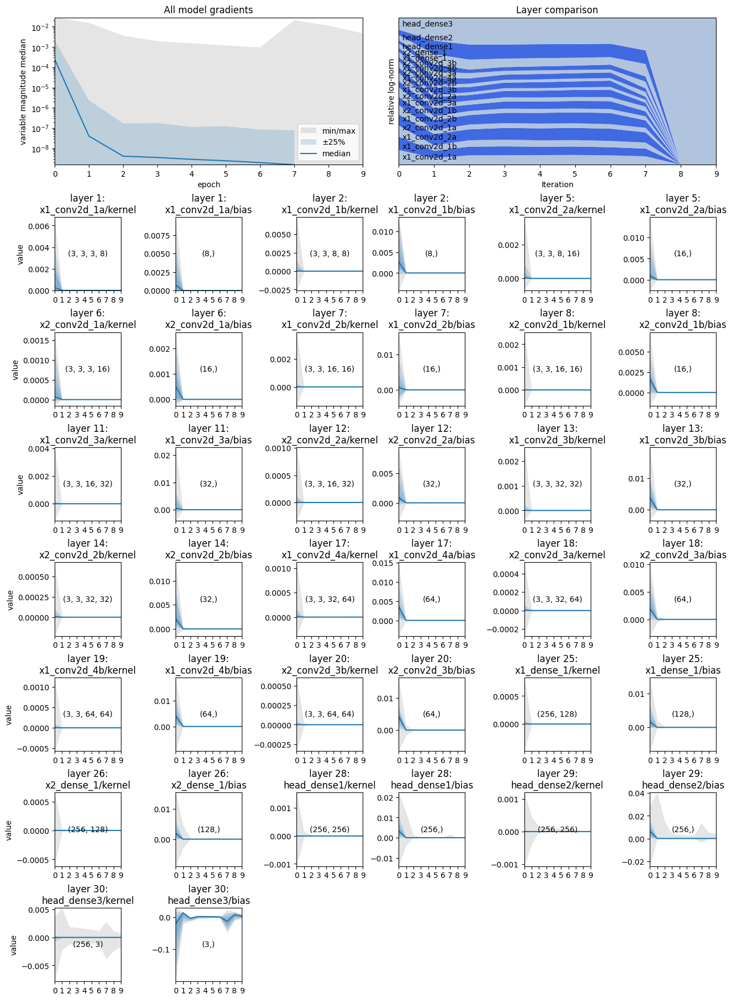

In [ ]:
tinstr.plot_value_history(gradients, show="values")

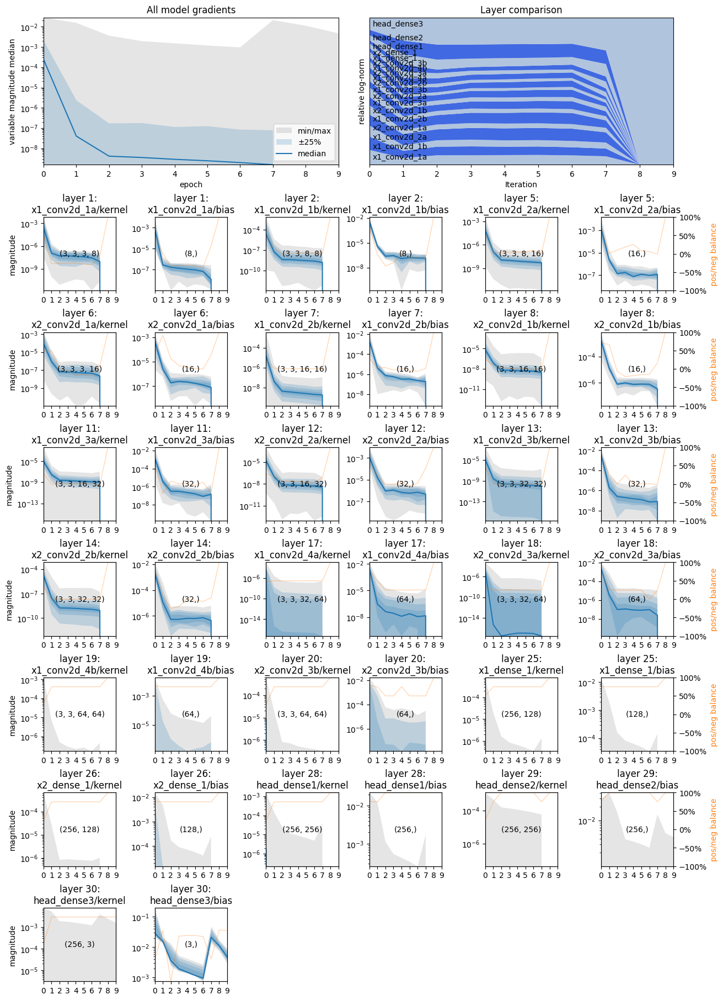

In [ ]:
tinstr.plot_value_history(gradients, show="magnitudes")

**Commentary**

* This illustrates an extreme case of neuron death - where some layers actually reach 100% dead neurons. At that point learning stops and it can never recover.
* But notice how aggressive it is - in the space of a single epoch, some of the layers jump to 80%+ neuron death. It's bad news from the first epoch.


## Troubleshooting
There's so much going on in the activity plots above, across so many layers, that it can be hard to know where to start.

Here's some initial observations and some pointers for interpreting the results:
* Firstly, in an extreme case like this, I initially ignore the activity rates and look only at the percentage of dead channels. Secondly, I start at the end of the network, closest to the loss calculation.
* Notice that the very last layer behaves well. It has 0% dead channels for most of the initial epochs. So gradients are still passing from the loss through this very first layer.
* The immediately previous layer, on the other hand, does very badly, jumping to 80% dead channels in the first epoch.
* This gives us one boundary of the region of problem - the second to last layer of the network, and it appears strongly on the first epoch.
* Now I go to the start of the network and look for the first layer that shows signs of a correlative increase in dead channels on the first epoch. In this case we're looking at `conv2d_4a` of the x1 input arm, and `conv2d_3a` of the x2 input. These are both the first layer of the last down block of their respective input arms.
* Notice that while earlier layers do eventually experience neuron death, they do so later on in training, and so they are easy to rule out as side-effects rather than cause.

Plotting the gradients gives us information about the information flow from the last layer towards the first.

By plotting the layer outputs, we can get information about how information flows through the model from the first layer towards the last. Let's do that now....

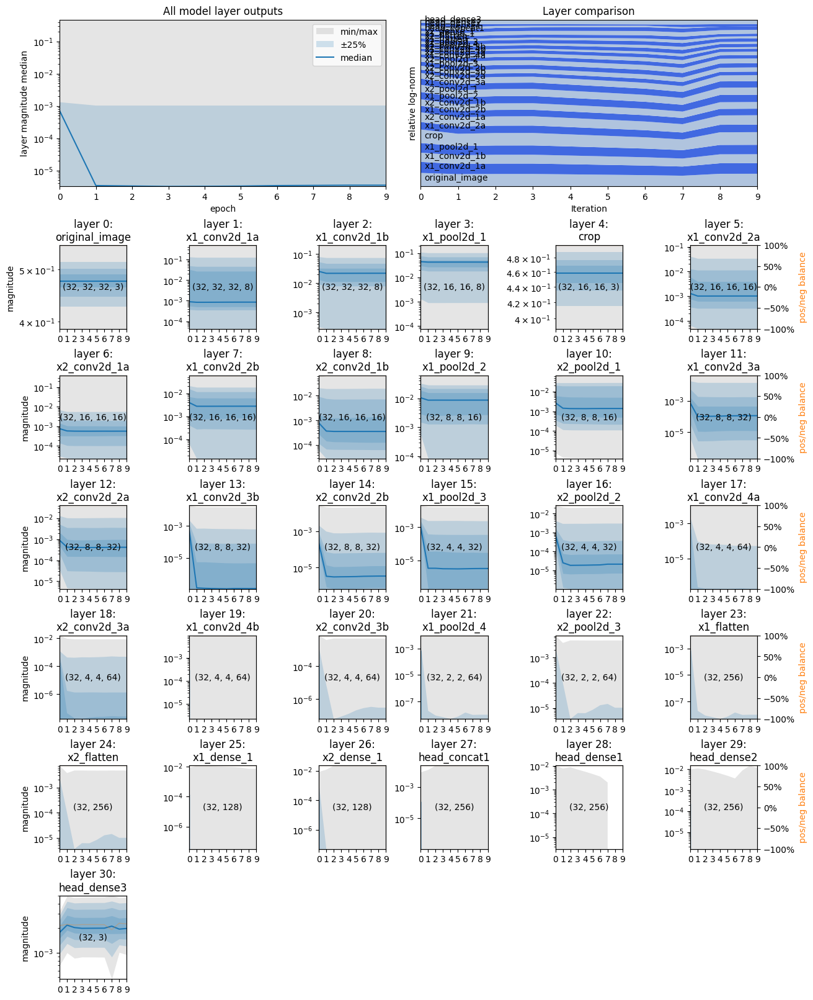

In [ ]:
tinstr.plot_value_history(outputs)

**Commentary**

There's a couple of concerning points there:
* the flat lines don't look good. There should be some variation. The fact that the output values are so stable suggests no learning is going on.
* the later layers look like they've dropped to zero output.

Just like we can generate an activity plot against the gradients, we can do the same thing against the layer outputs. Let's do just that...

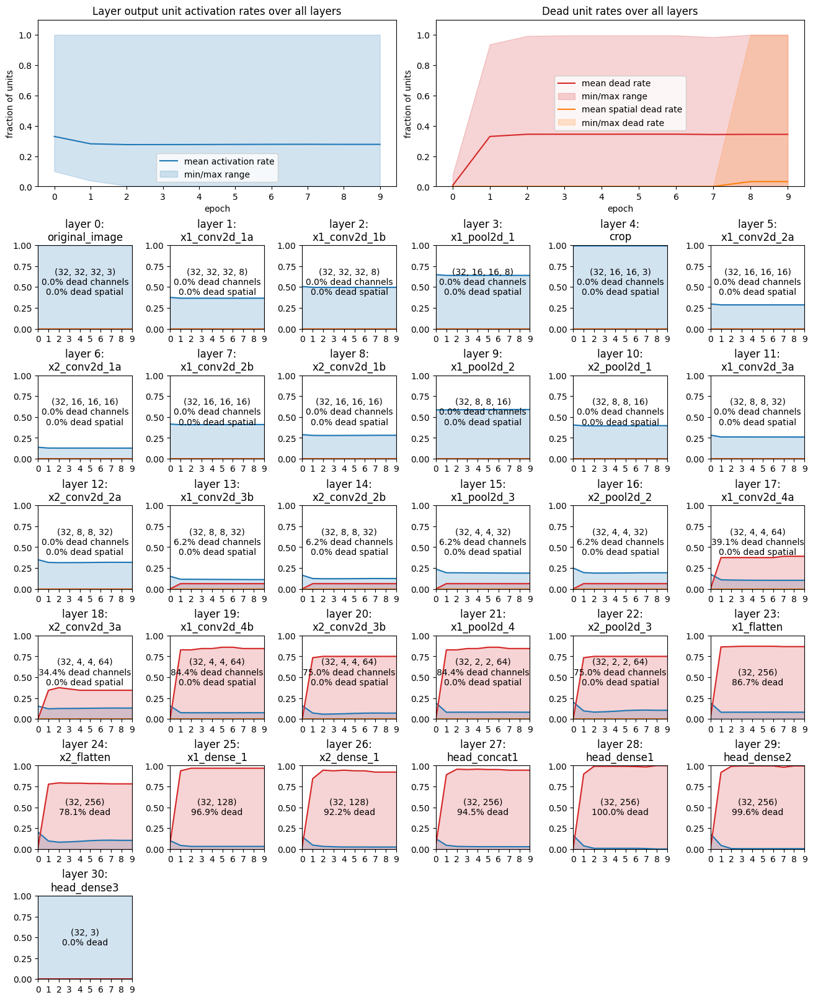

In [ ]:
tinstr.plot_activity_history(outputs)

**Commentary**

* The earlier layers don't suffer from neuron death at first, but there's something more subitle worth noticing. The very first conv layer of both the x1 and x2 input arm remain at 50% activity throughout. That's common for the very first step of training, but rare to remain like that throughout training. A correctly initialised and untrained ReLU layer has a 50:50 chance of emitting a positive value or a zero for each individual element of its output. In a batch size of 32, the same output element will be positive for approximately 50% of those samples. Thus you expect the very first iteration to sit at around 50% activation. In practice, networks usually quickly optimise to have far higher activation rates throughout most of their training. But we're not seeing that.
* Furthermore, some of the other layers sit almost constant at much lower activation rates. For example, `x1_conv2d_2b` drops as low as 20% by epoch 1, and `x1_conv2d_3b` is even worse. It's low activation rates like this which are usually precursors to neuron death.
* Is this because the weights are close to zero?

Let's quickly check the weights...

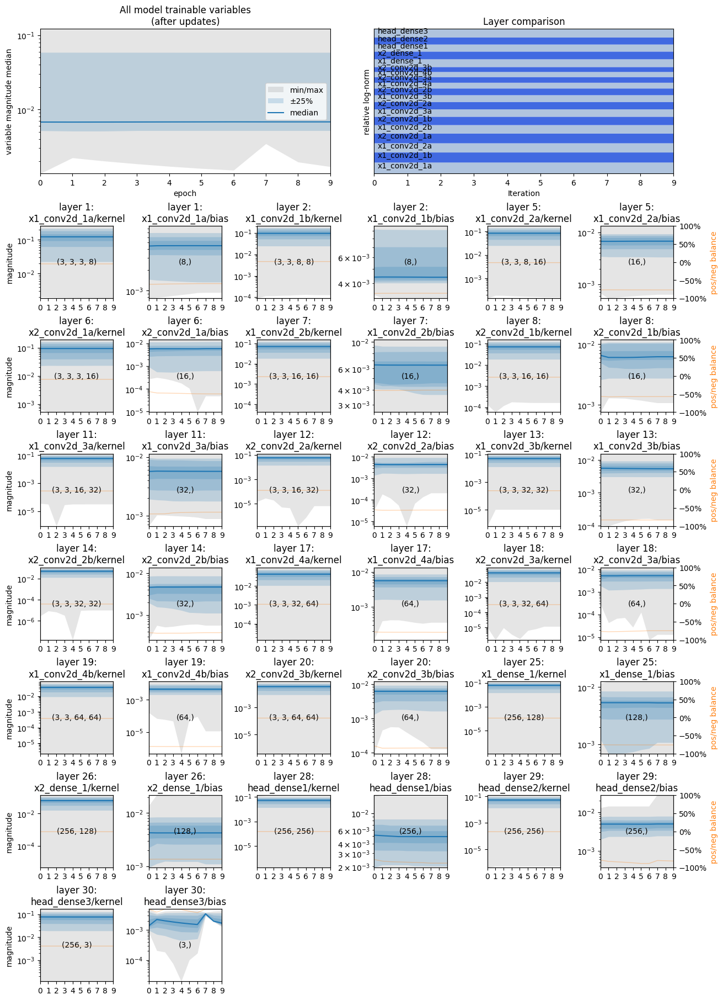

In [ ]:
tinstr.plot_value_history(variables)

**Commentary**

Apparently there's no problem with the weights themselves. The weights and biases all look very health (aside from the concerning level of stability due to a general lack of training actually doing anything).

## Detailed troubleshooting via 'train explainer'
We've identified that something's going on within the first epoch. Let's drill in closer by capturing data each step.

We'll also capture raw values so that we can use the [train explainer](https://github.com/malcolmlett/training-instrumentation-toolkit/blob/main/doc/train-explainer.ipynb) to automatically analyse the cause of neuron death. Capturing raw values can consume a lot of memory, so we need to identify up front which layers we'll apply that to. We'll focus on these layers:
* `[1]: x1_conv2d_1a  (input layer [0])`
* `[7]: x1_conv2d_2b  (input layer [5])`
* `[29]: head_dense2  (input layer [28])`

In total this requires us to capture the variables, gradients, outputs, and output gradients for all of those layers, plus the layer outputs for their input layers. I find the activity plot above is the easiest way of identifying these layers by number.

In [ ]:
target_layer_idxs = [1, 7, 29]
input_layer_idxs = [0, 5, 28]
tf.keras.utils.set_random_seed(9)

# use of before_updates=True, and batch_reduction=None needed for train_explainer to work correctly
variables = tinstr.VariableHistoryCallback(collection_sets=[{'layer_indices': target_layer_idxs}], before_updates=True, per_step=True)
gradients = tinstr.GradientHistoryCallback(collection_sets=[{'layer_indices': target_layer_idxs}], per_step=True)
outputs = tinstr.LayerOutputHistoryCallback(collection_sets=[{'layer_indices': input_layer_idxs}, {'layer_indices': target_layer_idxs}], batch_reduction=None, per_step=True)
output_gradients = tinstr.LayerOutputGradientHistoryCallback(collection_sets=[{'layer_indices': target_layer_idxs}], batch_reduction=None, per_step=True)

model = baseline_conv_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=[]
)
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=3, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats(per_step=True)])

Epoch 1/3
188/188 ━━━━━━━━━━━━━━━━━━━━ 61s 276ms/step - loss: 0.0320
Epoch 2/3
188/188 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0318
Epoch 3/3
188/188 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0318


**Commentary**

First, let's review the overall training plots, and the activity rates of the gradients as before, but this time it's been collected on a per-step basis...

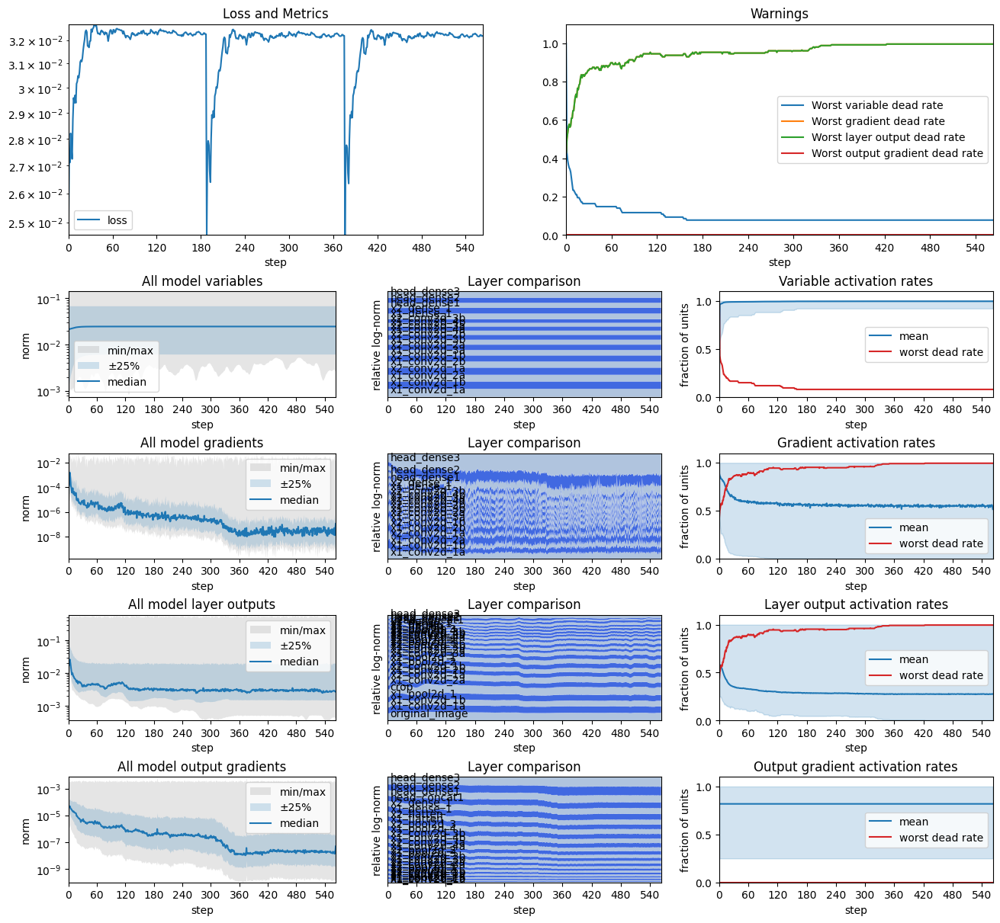

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

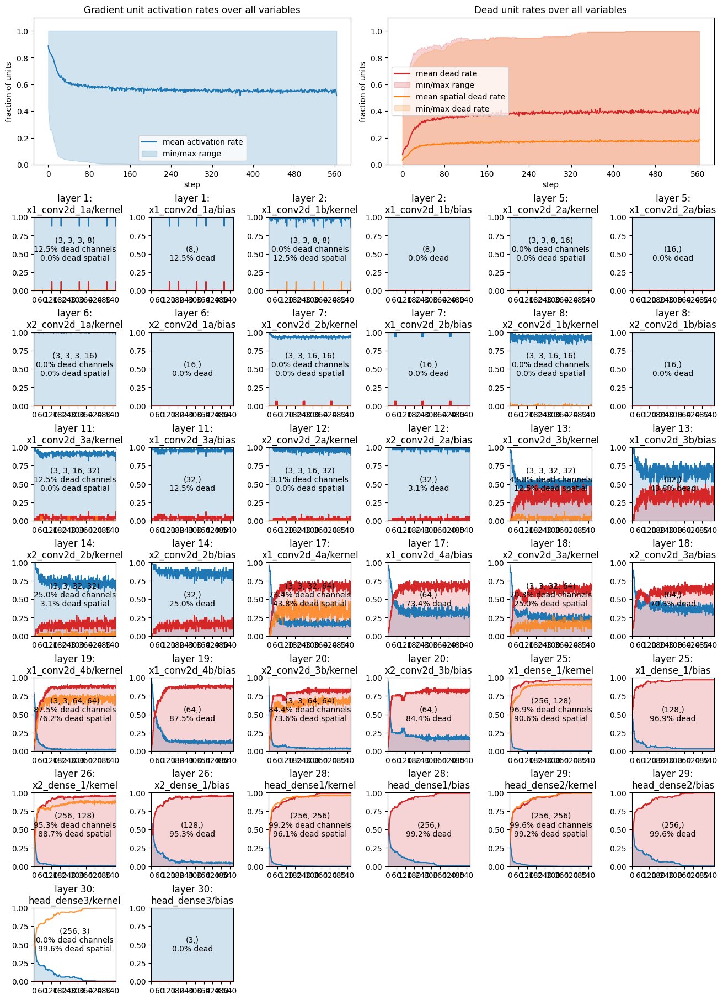

In [ ]:
tinstr.plot_activity_history(gradients)

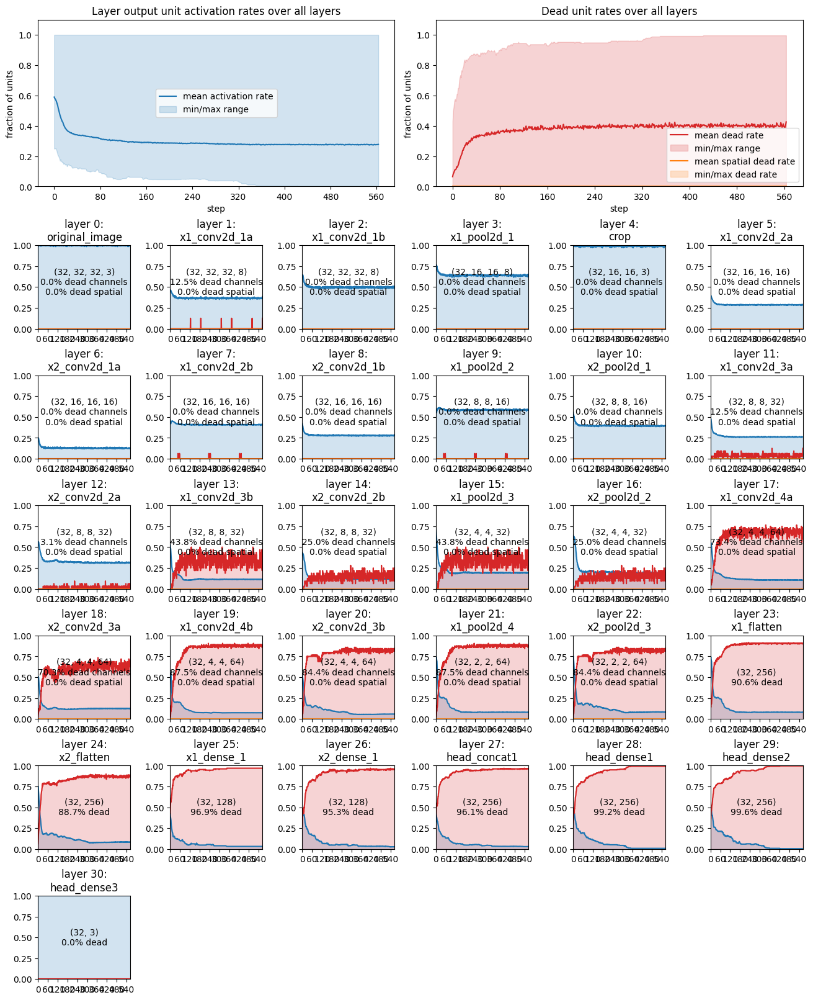

In [ ]:
tinstr.plot_activity_history(outputs)

**Commentary**
* A brief word of warning: the above stats are collected _per-step_, meaning that they're only calculated on a single batch at a time, rather than the entire dataset. This means that low activity rates and neuron death will be a little exaggerated. But that's OK. We already know from the _per-epoch_ results that these values are indeed representative of the model behaviour across the whole training dataset.
* The final layer has 0% dead channels. That's not surprising given that it uses a linear activation function. But 99.2% of the inputs to the last layer are dead by the end of 3 epochs. The `head_dense2` layer outputs themselves are mostly all zeros, and this translates to mostly all zero gradients.
* Notice also that the activity rates of layer outputs gets very low across the board. Of particular concern is that this happens even in the earliest layers.


**Train Explainer**

We'll now use the [train explainer](https://github.com/malcolmlett/training-instrumentation-toolkit/blob/main/doc/train-explainer.ipynb) to automatically analyse some of these layers looking for causes of neuron death. It emulates some of the key calculations within the target layer, both in the forward and backward directions, and examines how the results of each calculation are affected by its different inputs. It sees _inside_ the workings of layer, and shows us what forces are at play to lead to neuron death.

If you haven't already, take a look at the notebook linked above for a detailed explanation of the 'train explainer' report.

To begin, let's look at the first conv layer on the x1 arm (`x1_conv2d_1a`). It seems to remain remarkably stagnant, so we'll generate a train explainer report for each of the first 3 training update steps.

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=1, step=0)

Examining layer #1 at iteration 0:
  layer:               x1_conv2d_1a
  units:               8
  weights:             216
  input from layers:   [0]
  output to layers:    [2]
  near-zero gradients: 3 (1.4%) < 1.3722262792725815e-07

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 32, 32, 3) -> total values: 98304
  summary:           0.9% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 3, 8) -> total values: 216
  summary:           1.4% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 32, 32, 8) -> total values: 262144
  sum

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=1, step=1)

Examining layer #1 at iteration 1:
  layer:               x1_conv2d_1a
  units:               8
  weights:             216
  input from layers:   [0]
  output to layers:    [2]
  near-zero gradients: 3 (1.4%) < 2.3174891339294845e-08

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 32, 32, 3) -> total values: 98304
  summary:           0.9% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 3, 8) -> total values: 216
  summary:           1.4% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 32, 32, 8) -> total values: 262144
  sum

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=1, step=2)

Examining layer #1 at iteration 2:
  layer:               x1_conv2d_1a
  units:               8
  weights:             216
  input from layers:   [0]
  output to layers:    [2]
  near-zero gradients: 3 (1.4%) < 7.092137366271345e-08

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 32, 32, 3) -> total values: 98304
  summary:           0.8% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 3, 8) -> total values: 216
  summary:           1.4% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 32, 32, 8) -> total values: 262144
  summ

**Commentary**

_Note: the exact numbers below and in subsequent commentaries are taken from one particular run, and the notebook has since been updated following later runs, but the overall trends are still about the same._

For layer `x1_conv2d_1a`, its pre-activation outputs are sitting pretty consistently around 39% negative (measured evenly across all dimensions in its 4-dim output tensor). Corresponding, this leads to about 39% of post-activation outputs as zero (ReLU activation).

> ```
> [step 0] Z_l - pre-activation output:
>   shape:             (32, 32, 32, 8) -> total values: 262144
>   summary:           39.6% negative
> [step 1] Z_l - pre-activation output:
>   shape:             (32, 32, 32, 8) -> total values: 262144
>   summary:           39.4% negative, 12.5% of units always near-zero or negative across all batch and spatial dims
> [step 2] Z_l - pre-activation output:
>   shape:             (32, 32, 32, 8) -> total values: 262144
>   summary:           39.2% negative
> ```

For a single batch, that's a little higher than we might like, but it's probably not too unreasonable. And it doesn't appear to be affecting the gradients too badly:

> ```
> [step 0] compute dJ/dW_l = A_0 conv^T dJ/dZ_l:
>   inputs examined:   A_0^T, dJ/dZ_l
>   summary:           1.4% near-zero, of which 99.9% are affected by near-zero values from dJ/dZ_l  
> [step 1] compute dJ/dW_l = A_0 conv^T dJ/dZ_l:
>   inputs examined:   A_0^T, dJ/dZ_l
>   summary:           12.5% near-zero, of which 100.0% are affected by near-zero values from dJ/dZ_l
> [step 2] compute dJ/dW_l = A_0 conv^T dJ/dZ_l:
>   inputs examined:   A_0^T, dJ/dZ_l
>   summary:           0.5% near-zero
> ```


Now let's go a little deeper into the network on the same x1 arm, looking instead at `x1_conv2d_2b`, layer 7...

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=7, step=0)

Examining layer #7 at iteration 0:
  layer:               x1_conv2d_2b
  units:               16
  weights:             2304
  input from layers:   [5]
  output to layers:    [9]
  near-zero gradients: 24 (1.0%) < 1.786621339761041e-08

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 16, 16, 16) -> total values: 131072
  summary:           59.2% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 16, 16) -> total values: 2304
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 16, 16, 16) -> total values: 131

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=7, step=1)

Examining layer #7 at iteration 1:
  layer:               x1_conv2d_2b
  units:               16
  weights:             2304
  input from layers:   [5]
  output to layers:    [9]
  near-zero gradients: 28 (1.2%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 16, 16, 16) -> total values: 131072
  summary:           60.5% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 16, 16) -> total values: 2304
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 16, 16, 16) -> total values: 131072
  summary:      

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=7, step=2)

Examining layer #7 at iteration 2:
  layer:               x1_conv2d_2b
  units:               16
  weights:             2304
  input from layers:   [5]
  output to layers:    [9]
  near-zero gradients: 48 (2.1%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 16, 16, 16) -> total values: 131072
  summary:           60.7% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 16, 16) -> total values: 2304
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 0.0% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 16, 16, 16) -> total values: 131072
  summary:      

In [ ]:
# for comparison, last step in our 3-epoch training run
last_step = len(outputs.model_norm_stats)-1
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=7, step=last_step)

Examining layer #7 at iteration 563:
  layer:               x1_conv2d_2b
  units:               16
  weights:             2304
  input from layers:   [5]
  output to layers:    [9]
  near-zero gradients: 129 (5.6%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (16, 16, 16, 16) -> total values: 65536
  summary:           71.5% near-zero
W_l - weights of target layer:
  shape:             (3, 3, 16, 16) -> total values: 2304
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 2.3% near-zero
compute Z_l = A_0 conv W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (16, 16, 16, 16) -> total values: 65536
  summary:     

In [ ]:
# Finally, we'll also print the verbose report on the last step
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=7, step=last_step, verbose=True)

Examining layer #7 at iteration 563:
  layer:               x1_conv2d_2b
  units:               16
  weights:             2304
  input from layers:   [5]
  output to layers:    [9]
  near-zero gradients: 129 (5.6%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer
  PZN      <- breakdown of values into (P)ositive, near-(Z)ero, or (N)egative
  x . y    <- matmul (aka dot product)
  x (.) y  <- element-wise multiply

Forward pass...
A_0 - input value:
  shape:             (16, 16, 16, 16) -> total values: 65536
  summary:           71.5% near-zero (= 0), 0.0% of units always near-zero across all batch and spatial dims
  value percentiles: [0, 25, 50, 75, 100] -> [0.         0.         0.         0.00569597 0.247427  ]
  PZN counts/sums:   Z: 46843.0 = Σ 0.0, P: 18693.0 = Σ 62

**Commentary**

Based on the plots alone, `x1_conv2d_1a` and `x1_conv2d_2b` look to be fairly similar. But once we analyse deeper, we can see that `x1_conv2d_2b` has more fascinating story to tell...which I'll examine in three parts.

Inputs to x1_conv2d_2b:

> ```
> A_0 - input value:
>   shape:             (32, 16, 16, 16) -> total values: 131072
>   [step 0]   summary:  66.7% near-zero, 6.2% of units always near-zero across all batch and spatial dims
>   [step 1]   summary:  66.5% near-zero, 6.2% of units always near-zero across all batch and spatial dims
>   [step 2]   summary:  65.5% near-zero
>   [step 563] summary:  68.3% near-zero, 6.2% of units always near-zero across all batch and spatial dims
> ```

* The input to this layer remains consistently at around 67% near-zero, from the very first step through to the last step (3 epochs).
* We know that the model enters high neuron death within the first epoch, but it can't do that during the very first step before any updates have been applied. So it seems that the inputs to this layer are not the cause of the problem.

Pre-activation output:

> ```
> Z_l - pre-activation output:
>   shape:             (32, 16, 16, 16) -> total values: 131072
>   [step 0]   summary:  46.7% negative
>   [step 1]   summary:  47.6% negative
>   [step 2]   summary:  49.7% negative
>   [step 563] summary:  73.7% negative
> ```

* The pre-activation outputs from this layer start at 47% but steadily increase, reaching 74% after 3 epochs.
* It looks like this layer is being pushed towards neuron death.

Backprop:

> ```
> dJ/dA_l - backprop into this layer:
>   shape:               (32, 16, 16, 16) -> total values: 131072
>   [step 0]   summary:  75.0% near-zero
>   [step 1]   summary:  75.0% near-zero
>   [step 2]   summary:  75.0% near-zero
>   [step 563] summary:  75.0% near-zero
> compute dJ/dZ_l = dJdA_l (.) S_l:
>   inputs examined:     dJ/dA_l, S_l
>   shape:               (32, 16, 16, 16) -> total values: 131072
>   [step 0]   summary:  84.0% near-zero, of which 89.3% are affected by near-zero values from dJ/dA_l
>   [step 1]   summary:  84.1% near-zero, of which 89.2% are affected by near-zero values from dJ/dA_l
>   [step 2]   summary:  84.4% near-zero, of which 88.9% are affected by near-zero values from dJ/dA_l
>   [step 563] summary:  90.4% near-zero, of which 82.9% are affected by near-zero values from dJ/dA_l
>                        (and 81.5% affected by near-zero values from S_l)
> compute dJ/dW_l = A_0 conv^T dJ/dZ_l:
>   inputs examined:     A_0^T, dJ/dZ_l
>   shape:               (3, 3, 16, 16) -> total values: 2304
>   [step 0]   summary:  19.2% near-zero, of which 98.8% are affected by near-zero values from A_0^T
>   [step 1]   summary:  19.5% near-zero, of which 97.3% are affected by near-zero values from A_0^T
>   [step 2]   summary:   8.6% near-zero, of which 99.7% are affected by near-zero values from A_0^T
>   [step 563] summary:  33.6% near-zero, of which 98.4% are affected by near-zero values from A_0^T
>                        (and 92.7% affected by near-zero values from dJ/dZ_l)
> ```

* There's a consistent 75% near-zero rate for $\frac{\partial J}{\partial A_l}$, the gradients back-propagated from the next layer to this. That's a high percentage. It'll mean that there's a weak training signal reaching this layer, but it won't cause it to produce negative pre-activation outputs.
* Within a single layer, there are two steps to calculating the gradients for its weights. You first need to compute $\frac{\partial J}{\partial Z_l}$, the gradients w.r.t to the layer's pre-activation output. This is computed by element-wise multiplication between the backprop'ed $\frac{\partial J}{\partial A_l}$, and the "effect" of the layer's activation function. Because our layer uses ReLU, this effect is just a matrix of 1s and 0s depending on whether the output was passed through unchanged or zeroed out by ReLU. This calculation results in 85+% near-zero values. You have to view the report in verbose mode to see the full details, but it turns out that this is caused almost equally by the near-zeros coming from the back-prop gradients and from the layer's own outputs.
* The final calculation of weight gradients takes both the above calculated $\frac{\partial J}{\partial Z_l}$ and the layer's input $A_{l-1}$ (indicated as `A_0` in the report because it's hard to represent $A_{l-1}$ in ASCII). Both of those inputs have a high percentage of near-zeros, and they're both contributing to the near-zeros in the final weight gradients.
* It's instructive to note that the weight gradients suffer from near-zeros much less so than their inputs. This is a result of the way that matrix multiplication works, summing across corresponding rows and columns of the input matrices, effectively averaging or smoothing out the presence of single-element zeros by the presence of non-zeros found elsewhere. This is why it's possible for a network to continue to train in the presence of neuron death, and even to recover neurons that had been dead before.

In all, this layer suffers from near-zeros in all directions: i) from its inputs, ii) from the backprop gradients, and iii) from its own output (due to negative pre-activation outputs). This layer is probably the victim, not the contributing cause.

Now let's jump to the end of the network and look at `head_dense2` (layer 29). We'll again generate reports for the first 3 steps, and for the very last step of the 3-epoch training run...

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=29, step=0)

Examining layer #29 at iteration 0:
  layer:               head_dense2
  units:               256
  weights:             65536
  input from layers:   [28]
  output to layers:    [30]
  near-zero gradients: 34529 (52.7%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 256) -> total values: 8192
  summary:           51.1% near-zero, 31.6% of units always near-zero across all batch dims
W_l - weights of target layer:
  shape:             (256, 256) -> total values: 65536
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 1.0% near-zero
compute Z_l = A_0 . W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 256)

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=29, step=1)

Examining layer #29 at iteration 1:
  layer:               head_dense2
  units:               256
  weights:             65536
  input from layers:   [28]
  output to layers:    [30]
  near-zero gradients: 38405 (58.6%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 256) -> total values: 8192
  summary:           50.4% near-zero, 34.8% of units always near-zero across all batch dims
W_l - weights of target layer:
  shape:             (256, 256) -> total values: 65536
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 1.0% near-zero
compute Z_l = A_0 . W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 256)

In [ ]:
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=29, step=2)

Examining layer #29 at iteration 2:
  layer:               head_dense2
  units:               256
  weights:             65536
  input from layers:   [28]
  output to layers:    [30]
  near-zero gradients: 40750 (62.2%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (32, 256) -> total values: 8192
  summary:           52.6% near-zero, 38.7% of units always near-zero across all batch dims
W_l - weights of target layer:
  shape:             (256, 256) -> total values: 65536
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 1.0% near-zero
compute Z_l = A_0 . W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (32, 256)

In [ ]:
last_step = len(outputs.model_norm_stats)-1
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=29, step=last_step)

Examining layer #29 at iteration 563:
  layer:               head_dense2
  units:               256
  weights:             65536
  input from layers:   [28]
  output to layers:    [30]
  near-zero gradients: 65534 (100.0%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer

Forward pass...
A_0 - input value:
  shape:             (16, 256) -> total values: 4096
  summary:           99.2% near-zero, 99.2% of units always near-zero across all batch dims
W_l - weights of target layer:
  shape:             (256, 256) -> total values: 65536
  summary:           1.0% near-zero
  corresponding to near-zero gradients: 1.0% near-zero
compute Z_l = A_0 . W_l + b_l:
  inputs examined:   A_0, W_l
  summary:           1.0% near-zero
Z_l - pre-activation output:
  shape:             (16, 2

In [ ]:
# and in verbose mode...
last_step = len(outputs.model_norm_stats)-1
texpl.explain_near_zero_gradients([variables, gradients, outputs, output_gradients], layer_index=29, step=last_step, verbose=True)

Examining layer #29 at iteration 563:
  layer:               head_dense2
  units:               256
  weights:             65536
  input from layers:   [28]
  output to layers:    [30]
  near-zero gradients: 65534 (100.0%) = 0

Let:
  A_0      <- input activation to target layer
  W_l      <- weights of target layer
  Z_l      <- pre-activation output of target layer
  S_l      <- effect of activation function as element-wise multiplier
  A_l      <- output activation of target layer
  PZN      <- breakdown of values into (P)ositive, near-(Z)ero, or (N)egative
  x . y    <- matmul (aka dot product)
  x (.) y  <- element-wise multiply

Forward pass...
A_0 - input value:
  shape:             (16, 256) -> total values: 4096
  summary:           99.2% near-zero (= 0), 99.2% of units always near-zero across all batch dims
  value percentiles: [0, 25, 50, 75, 100] -> [0.        0.        0.        0.        0.0066273]
  PZN counts/sums:   Z: 4064.0 = Σ 0.000000, P: 32.0 = Σ 0.172383
  PZN co

**Commentary**

Here we're seeing a very different behaviour to the earlier layers. Let's examine it in the same way we did for the previous layer...

Inputs:

> ```
> A_0 - input value:
>   shape:              (32, 256) -> total values: 8192
>   [step 0]   summary: 51.3% near-zero, 24.6% of units always near-zero across all batch dims
>   [step 1]   summary: 52.7% near-zero, 34.0% of units always near-zero across all batch dims
>   [step 2]   summary: 54.5% near-zero, 39.8% of units always near-zero across all batch dims
>   [step 563] summary: 98.4% near-zero, 98.4% of units always near-zero across all batch dims
> ```

* The inputs to this layer start off fairly bad even on step 0, before any updates have been applied to any layers, but they get steadily worse.
* The total near-zero percentage (across all tensor elements, regardless of meaning) is a clear omen for unit death (given output unit is zero for all samples in the batch).

Pre-activation outputs:

> ```
> Z_l - pre-activation output:
>   shape:              (32, 256) -> total values: 8192
>   [step 0]   summary: 48.8% negative, 26.2% of units always near-zero or negative across all batch dims
>   [step 1]   summary: 48.8% negative, 32.8% of units always near-zero or negative across all batch dims
>   [step 2]   summary: 51.1% negative, 35.5% of units always near-zero or negative across all batch dims
>   [step 563] summary: 98.8% negative, 98.8% of units always near-zero or negative across all batch dims
> ```

* The pre-activation outputs get increasingly negative. That's why we're getting neuron death.
* Notice that the rate of negative pre-activation outputs mirrors that of near-zero inputs. One possibility is that  the few remaining weights that correlate with non-zero inputs are negative - ie: the input is being modified by SGD to favour negative weights.
* The verbose report gives us the answer by grouping the outputs into whether each of the inputs is respectively positive (P), negative (N), or near-zero (Z). Listing that off organised by A_0 classification we have the following:

```
  P-input: PN: 8544.0 = Σ -4.955, PP: 7712.0 = Σ 4.165, PZ: 128.0 = Σ 0.000
  Z-input: ZN: 517488.0 = Σ 0.000, ZP: 504336.0 = Σ 0.000, ZZ: 10368.0 = Σ 0.000
  N-input: nil.
```

* In other words, we've got a lot of zero inputs that result in zeroes in the computed Z value. Not surprising given 98.4% near-zeros in the input.
* Of those inputs that are non-zero, on first glance there's a pretty good parity between positive and negative outcome...but there is in fact a bias towards negative weights (52.1% vs 47.1% of those multiplications with positive input elements) with an ultimate bias in the result.

Backprop:

> ```
> dJ/dA_l - backprop into this layer:
>   shape:              (32, 256) -> total values: 8192
>   [step 0]   summary: 1.0% near-zero
>   [step 1]   summary: 1.0% near-zero
>   [step 2]   summary: 1.0% near-zero
>   [step 563] summary: 1.0% near-zero
>     PZN counts/sums:   N: 2044.0 = Σ -1.312, P: 2011.0 = Σ 1.302, Z: 41.0 = Σ -0.000
>     PZN counts/means:  N: 49.9% x -0.000642036, P: 49.1% x 0.000647539, Z: 1.0% x -0.000001471
> ```

* The backprop from the last layer contains a reasonable percentage of near-zeros. In fact, the train-explainer applies heuristics to determine what it classifies as "near-zero", and one of its key heuristics is to pick the bottom 1-percentile. Thus it's default is to find exactly 1% of near-zeros.
* Furthermore, the rest of the backprop values are quite evenly split between negative and positive values. Thus all suggests that our loss function may be behaving correctly.

> ```
> compute dJ/dZ_l = dJdA_l (.) S_l:
>   inputs examined:    dJ/dA_l, S_l
>   shape:              (32, 256) -> total values: 8192
>   [step 0]   summary: 48.8% near-zero, of which 100.0% are affected by near-zero values from S_l
>   [step 1]   summary: 48.8% near-zero, of which 100.0% are affected by near-zero values from S_l
>   [step 2]   summary: 51.1% near-zero, of which 100.0% are affected by near-zero values from S_l
>   [step 563] summary: 98.8% near-zero, of which 100.0% are affected by near-zero values from S_l
>                       and 5.0% affected by near-zero values from dJ/dA_l
> ```

* Gradients flowing through the layer have rapidly progressed towards a high near-zero count.
* Note that this is almost entirely due to the layer's own output, rather than from the backprop gradients coming into the layer.

> ```
> compute dJ/dW_l = A_0^T . dJ/dZ_l:
>   inputs examined:    A_0^T, dJ/dZ_l
>   shape:              (256, 256) -> total values: 65536
>   [step 0]   summary: 47.7% near-zero, of which 72.5% are affected by near-zero values from A_0^T
>   [step 1]   summary: 57.3% near-zero, of which 72.5% are affected by near-zero values from A_0^T
>   [step 2]   summary: 62.6% near-zero, of which 73.8% are affected by near-zero values from A_0^T
>   [step 563] summary: 100.0% near-zero, of which 98.8% are affected by near-zero values from dJ/dZ_l
>                       and 98.5% affected by near-zero values from A_0^T
```

* Likewise, the final computed weight gradients quickly grow in the rate of near-zero values, and by the 3rd epoch we have 100% near-zero (for a single batch) and thus with a high neuron death.
* Notice that this outcome is an equally shared result of $A_{l-1}$ and $\frac{\partial J}{\partial Z_l}$. However, also note that $\frac{\partial J}{\partial Z_l}$ is primarily influenced by $S_l$, in terms of near-zero results, which itself is primarily influenced by $A_{l-1}$.


## Theory
We've identified that we're getting neuron death because pre-activation outputs are somehow being pushed towards negative. But _why_?

At this point I'd like to be able to say that there's a method for investigating exactly that 'why'. Unfortunately I can't. I've tried a few approaches but so far haven't found a way to get a good clear signal of the cause. One difficulty is that most of the components involved (gradients, outputs, etc.) still have a fairly even distribution between negative and positive values. Furthermore, if you ignore the percentage of zeros, the shape of the distributions in the above training run look very similar to distributions in successful training runs on more successful models. Another difficulty is that the problem only builds up slowly over time, and its signal is scattered in with noise from the rest of model training. I suspect that the trick lies in finding correlations between problematic layer outputs, the weights, and the gradients, and then integrating over multiple update steps. Maybe more on that at some later time....

Without that most direct approach, the next best thing is to develop a set of theories that might explain the behaviour. That will subsequently guide our attempts to find a solution.

There are a number of different ways that layers could be pushed towards zero/negative outputs. There's also a few guiding assumptions that we can make specific to the problem at hand.

### Theory development: guiding assumptions
1. We started this investigation puzzling why some neurons were producing high rates of zero gradients. Our first assumption draws from the conclusion we've already made: this is because the affected layers are producing high rates of zero outputs during the forward pass.
2. We've analysed three layers and a small sample of update steps and identified that we're getting zero outputs because the pre-activation outputs are being pushed negative. We assume that this continues to the the behaviour of the network across all problematic layers and across all epochs.

In short, the network is following an undesirable trend towards ever more negative pre-activation (Z) outputs, and we assume that it'll continue to do so.

### Theory development: possible causes
Now we examine what causes and mechanisms there might be for the network to push its Z outputs negative.

**Theory #1 "Because, ReLU"**
* A first naive theory is that layers with ReLU activation functions just do this. It's "a known problem". I don't buy that.
* The power of having these tools for visualising activity rates is that you start to see the difference between well-behaved and not-so-well-behaved networks. Well-behaved networks don't have high rates of neuron death. Well-behaved networks will have layers with activation rates anywhere from 50% and up, and will typically have very low rates of neuron death (up to 5%, in what I've seen so far).
* In any case, a common suggestion for this problem is to switch to some form of Leaky ReLU. However, I would recommend caution. With a Leaky ReLU, one might say that activation rates and death rates are eliminated. This is not really the case. Instead, the clear zero-state is replaced by a fuzzy near-zero state. Gradients won't be zero for these values, but they will be small. Effectively, a Leaky ReLU swaps out neuron death for vanishing gradients. Comments to this effect have been made by [Rister, B., & Rubin, D. L. (2020)](https://arxiv.org/pdf/2007.06192) and by [Whitaker, T., & Whitley, D. (2023)](https://arxiv.org/abs/2302.05818). In other words, with ReLU it is very easy to measure unit activation rates and death rates and to use them as a metric for network training efficiency. With Leaky ReLU, you lose that extremely useful signal for limited benefit.

**Theory #2 "Eliminating redundancy"**
* Perhaps our network has too much capacity.
* With redundancy in the weights it's quite possible for the network to gradually strengthen the weights that already have the highest correlation with the correct outputs, and to balance that by weakening the other weights. Eventually those weakened weights reach zero.
* This is _not_ the cause here. Our neuron death occurs within the first epoch, and the loss never improves beyond that first epoch.
* In any case, given our problems, it can be worth experimenting to see whether a significantly simpler or smaller model would train better.

**Theory #3 "Network as a malicious demon"**

* I find it helpful to think of neural networks and their training algorithms as a malicious demon intent on finding the most inconvenient way of minimising the loss. A less malicious but equally repugnant characteristic of this demon is that it will find the _laziest_ way to minimise loss.
* For a given densely connected layer (the logic works out the same for a convolutional layer, although the maths is a little different), there are four equations involved with the calculation of the gradients of the weights for that layer:

  1. $Z_l = A_{l-1} \cdot W_l + \vec{b_l}$

  2. $A_l = Z_l (\cdot) S_l$

  3. $\frac{\partial J}{\partial Z_l} = \frac{\partial J}{\partial A_l} (\cdot) \frac{\partial A_l}{\partial Z_l}$

  4. $\frac{\partial J}{\partial W_l} = A_{l-1}^T \cdot \frac{\partial J}{\partial Z_l}$

  * where:
    * $(\cdot)$ - element-wise multiplication
    * $A_{l-1}$, $A_l$ - input to the layer, post-activation output of the layer
    * $W_l$ and $\vec{b_l}$ - layer parameters
    * $Z_l$ pre-activation output of the layer
    * $S_l$ - element-wise multiplication equivalent of the activation function (eg: for ReLU it's a bunch of 1s and 0s depending on whether the corresponding element in Z is >= 0 or < 0), with $\frac{\partial A_l}{\partial Z_l} = S_l$ for ReLU layers
    * $\frac{\partial J}{\partial A_l}$ - the backprop gradients from the next layer
* This is all linear algebra, so in order to reduce the loss there's an equal probability of tweaking almost any of the components in those equations. More specifically, imagine that the outputs of the layer are predominantly positive and too large w.r.t. the loss, then gradient descent may chose to modify any of the following in any of the following ways in order to reduce the loss:
  * Reducing those $A_{l-1}$ elements that are predominantly associated with positive weights (remember that $A_{l-1}$ cannot contain negative values if the input layer was also a ReLU layer). Or likewise increasing those $A_{l-1}$ elements that are predominantly associated with negative weights
  * Decreasing those elements of $W$ that are predominantly associated with positive $A_{l-1}$ elements, or increasing those elements of $W$ that are predominantly associated with negative $A_{l-1}$ elements
  * Reducing the values of $b$ to either reduce the magnitude of outputs, or to push some units to zero.
  * Modifying the values of $A_{l-1}$ in such a way as to cause the gradient updates to $W$ or $b$ to have the effects described above.
  * Modifying values of $\frac{\partial J}{\partial A_l}$, the backprop to this layer, in such a way as to cause the gradient updates to $W$ or $b$ to have the effects described above.
  * Modifying any of the values above in such a way that the backprop gradients from this layer to its input layer cause $A_{l-1}$ to be updated in any of the ways described above.
* You'll notice that the paths for achieving a particular outcome get more and more convoluted. In gradient descent we compute all gradients in parallel and apply them across all layers in a single update. We're depending on all of those direct and indirect effects to achieve the best outcome. In contrast, a lazy demon will tend to avoid the more convoluted paths and will prefer to use the simplest approach possible, even if that will over-compensate or ultimately lead to undesired outcomes (like neuron death).
* Based on what we've seen in the analysis so far, one would assume that the particular demon in our case has found it easiest (or perhaps most malicious) to modify the weights in each layer so that it tends towards zero outputs. This would suggest the need for some form of regularization.
* Standard weight regularization acts to keep the magnitude of the weights small. We can see the value plots above that we're not obviously having a problems with escalating weight magnitudes. So I don't think that will help. In any case, our problem is a little more nuanced than simply applying a rule that all magnitudes must be small. Our problem necessities consideration of sign.
* I've not heard of any direct _regularization_ for the avoidance of neuron death. [Rister, B., & Rubin, D. L. (2020)](https://arxiv.org/pdf/2007.06192) carefully analysed neuron death and found that Batch Normalization can significantly help to ensure that a network can continue to produce results even in the face of neuron death, but it does not prevent neuron death. Simularly, residual and skip connections, where appropriate for the network, can also allow the network to continue to function in the face of high neuron death. [Rister, B., & Rubin, D. L. (2020)](https://arxiv.org/pdf/2007.06192) and [Whitaker, T., & Whitley, D. (2023)](https://arxiv.org/abs/2302.05818) have proposed more complicated schemes for partially re-initialising the network in order to recover from neuron death, but I won't go into those suggestions here.

**Theory #4 "Absent data pathway"**
* Another possibility comes down to the model architecture. In some cases there's no pathway from the data input, through the particular model architecture, to the expected data output. This happens, for example, where the transformations within the model discard key information that are needed for correct output.
* It turns out that our naive siamese-CNN-based model is an example of this. We're asking our model to output spatial information. Strided convolutions (conv + maxpool layers in our case) are designed for retaining local textural feature information, while discarding global spatial information. It's exactly this translational invariance that they were designed for. In our model we've reduced the resolution to a 4x4 grid before passing it through a dense layer. Only the coordinates of the inputs to the dense layer have any worthwhile spatial information.
* In the extreme case, if the model passes no information through its layers that bears any correlation to the desired outputs, the model will simply learn to emit a constant - one that minimises the loss across all training samples. A constant can be produced very easily via the bias of the last layer alone, provided that the product of inputs and weights are zero.
* When this is the cause, no amount of Leaky ReLUs, Dropout, or BatchNormalization will ever help.
* Given what we've seen, I'd say that this is the best theory explaining the cause of neuron death in this particular problem example. But it won't always be the explanation.

## Solutions

For the sake of completion we'll briefly experiment with some of the solutions suggested above. However, note that our fundamental problem in this case is the model architecture. So what we'll see is that none of the solutions work well, but we can get a feel for how they can improve the situation a little.

If the model architecture were better suited to the problem, then the extent and aggressiveness of neuron death would be less than what we've seen above even without any of these solutions. But the effect of these solutions would be harder to see, and it was fun watching how badly a network can fail, right?

Furthermore, it turns out that image alignment is a _very difficult_ problem in neural-network based machine learning. I chose this particular network and problem domain because it was one that was plaguing me. I didn't know at the time just how difficult this domain is. Today, many of the best solutions still employ a combination of neural networks with more traditional hand-written algorithms, such as to do the angular math. For further reading, take a look at the references listed in the final section of this notebook.

**Solution #1 - Dropout**

Dropout acts on the layer immediate before it, zero-ing out some of that layer's outputs before passing them onto the next layer. This encourages the next layer to use a wider sampling of those outputs in order to gain the feature information it needs for its own processing.

We'll add dropout _after_ some of the layers with the greatest neuron death.

As is common for CNN models, we'll use 20% dropout.

A question might arise whether dropout will lead to an increase in reported neuron death in the activity plots. In practice, for a well-behaved network, dropout will have a negligeable effect on neuron death. The reason is that dropout is applied randomly across all samples, even those within the same batch. In a batch with 32 samples, all 32 samples have to produce a zero output for a given unit/channel in order for that to be counted as neuron neath. The chances of that happening due to dropout is very low.

Dropout _can_ be seen in the activation rates. In general, dropout _intersects_ with zero-outputs due to activation rate.  If activation rates are already 100%, adding a 20% dropout should drop the activation rates to 80%. If activation rates are already around 50%, then about 50% of the dropped-out elements will already have been zero anyway, so adding a 20% dropout will approximately reduce the activation rates by only a further 10%.

However, when activation rate is already very low, and when some neurons are already close to death, dropout can noticeably increase neuron death rates. In fact, we will see this below where adding dropout reduces the stability of training.

**Solution #2 - Normalization**

Batch Normalization works to re-scale and re-center the distribution of values passed through it. It's most advertised feature is that it prevents radically large values. In that sense a Batch Norm layer could be placed _after_ a layer. However, for our needs, a Batch Norm layer will work best when placed _between_ the pre-activation outputs of a layer and its activation function. That gives it a chance to shift negative values towards positive, before the ReLU activation function truncates them to zero.

In our experiment, we'll thus split the layers with the greatest neuron death and insert Batch Norm before their activation functions.

**Solution #3 - Simpler network**

We discussed above that a possible reason for neuron death is redundancy. Do we do better with a simpler network? Surprisingly, the answer is "yes"...to a point.

**Solution #4 - CoordConv**

The final experiment will be to address the lack of spatial information flow within the present architecture. We'll rectify this by introducing explicit spatial information into the network, in the form of the Coord Conv layer introduced by [Liu et al (2016)](https://arxiv.org/abs/1807.03247v2). This adds two extra channels to a given representation, encoding the x and y coordinates of each position within the representation.

As we'll see, this isn't enough to improve the situation much; a testament to how difficult the image alignment domain is.

---

_Tip: if you haven't already, it will help to open a second copy of this notebook in a separate tab so you can easily compare the results below with what we had earlier._


## Solution 1 - Dropout
The final head dense layers exihibit particularly strong neuron death rates, but there's also problems within earlier convolutional layers on both input arms.

We'll be moderate by adding dropout to the following places:
* at the end of each conv block, just before max-pooling.
* after the last wide head dense layer (the second to last layer)

In [ ]:
def dropout_model(dropout_rate):
    original_input = tf.keras.Input(shape=(32, 32, 3), name="original_image")
    crop_input = tf.keras.Input(shape=(16, 16, 3), name="crop")

    # A CNN stack for the 32x32 original image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1a')(original_input)
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1b')(x1)
    x1 = layers.Dropout(dropout_rate, name='x1_dropout_1')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_1')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2a')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2b')(x1)
    x1 = layers.Dropout(dropout_rate, name='x1_dropout_2')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_2')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3a')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3b')(x1)
    x1 = layers.Dropout(dropout_rate, name='x1_dropout_3')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_3')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4a')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4b')(x1)
    x1 = layers.Dropout(dropout_rate, name='x1_dropout_4')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_4')(x1)
    x1 = layers.Flatten(name='x1_flatten')(x1)
    x1 = layers.Dense(128, activation='relu', name='x1_dense_1')(x1)

    # Separate CNN stack for the 16x16 cropped input
    # - 16x16x3 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1a')(crop_input)
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1b')(x2)
    x2 = layers.Dropout(dropout_rate, name='x2_dropout_1')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_1')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2a')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2b')(x2)
    x2 = layers.Dropout(dropout_rate, name='x2_dropout_2')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_2')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3a')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3b')(x2)
    x2 = layers.Dropout(dropout_rate, name='x2_dropout_3')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_3')(x2)
    x2 = layers.Flatten(name='x2_flatten')(x2)
    x2 = layers.Dense(128, activation='relu', name='x2_dense_1')(x2)

    # Combined path
    # - 128 + 128 -> 256 -> 3 (dx, dy, da)
    out = layers.Concatenate(name='head_concat1')([x1, x2])
    out = layers.Dense(256, activation='relu', name='head_dense1')(out)
    out = layers.Dense(256, activation='relu', name='head_dense2')(out)
    out = layers.Dropout(dropout_rate, name='head_dropout_1')(out)
    out = layers.Dense(3, activation='linear', name='head_dense3')(out)

    return tf.keras.Model(inputs=[original_input, crop_input], outputs=out)

# Print off model summary
dropout_model(0.2).summary()

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ original_image            │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1a (Conv2D)     │ (None, 32, 32, 8)      │            224 │ original_image[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1b (Conv2D)     │ (None, 32, 32, 8)      │            584 │ x1_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_dropout_1 (Dropout)    │ (None, 32, 32, 8)      │              0 │ x1_conv2d_1b[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_1               │ (None, 16, 16, 8)      │              0 │ x1_dropout_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ crop (InputLayer)         │ (None, 16, 16, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2a (Conv2D)     │ (None, 16, 16, 16)     │          1,168 │ x1_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1a (Conv2D)     │ (None, 16, 16, 16)     │            448 │ crop[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x1_conv2d_2a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x2_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_dropout_2 (Dropout)    │ (None, 16, 16, 16)     │              0 │ x1_conv2d_2b[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_dropout_1 (Dropout)    │ (None, 16, 16, 16)     │              0 │ x2_conv2d_1b[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_2               │ (None, 8, 8, 16)       │              0 │ x1_dropout_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_pool2d_1               │ (None, 8, 8, 16)       │              0 │ x2_dropout_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_3a (Conv2D)     │ (None, 8, 8, 32)       │          4,640 │ x1_pool2d_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_2a (Conv2D)     │ (None, 8, 8, 32)       │          4,640 │ x2_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_3b (Conv2D)     │ (None, 8, 8, 32)       │          9,248 │ x1_conv2d_3a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_2b (Conv2D)

 Total params: 343,835 (1.31 MB)

 Trainable params: 343,835 (1.31 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
tf.keras.utils.set_random_seed(9)
variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = dropout_model(dropout_rate=0.2)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=10, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.0320
Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0318
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0318
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0318
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.0318
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.0318
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.0318
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0318
Epoch 9/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318
Epoch 10/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318


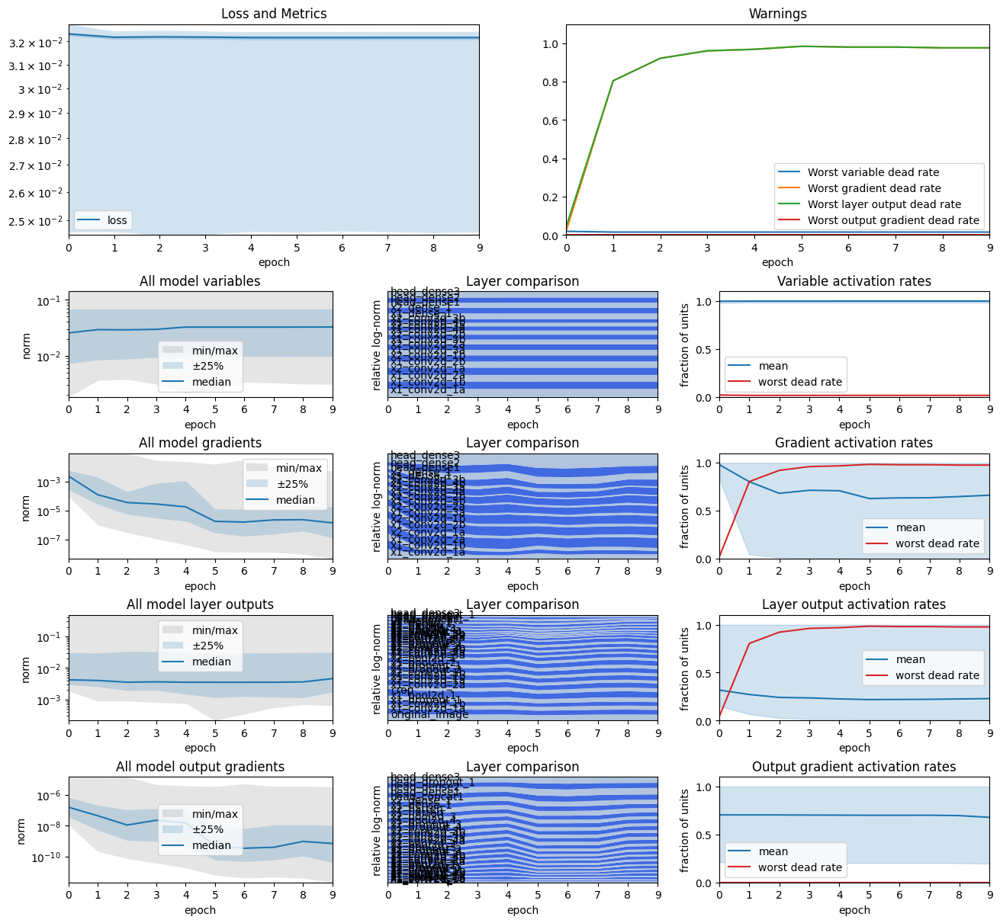

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

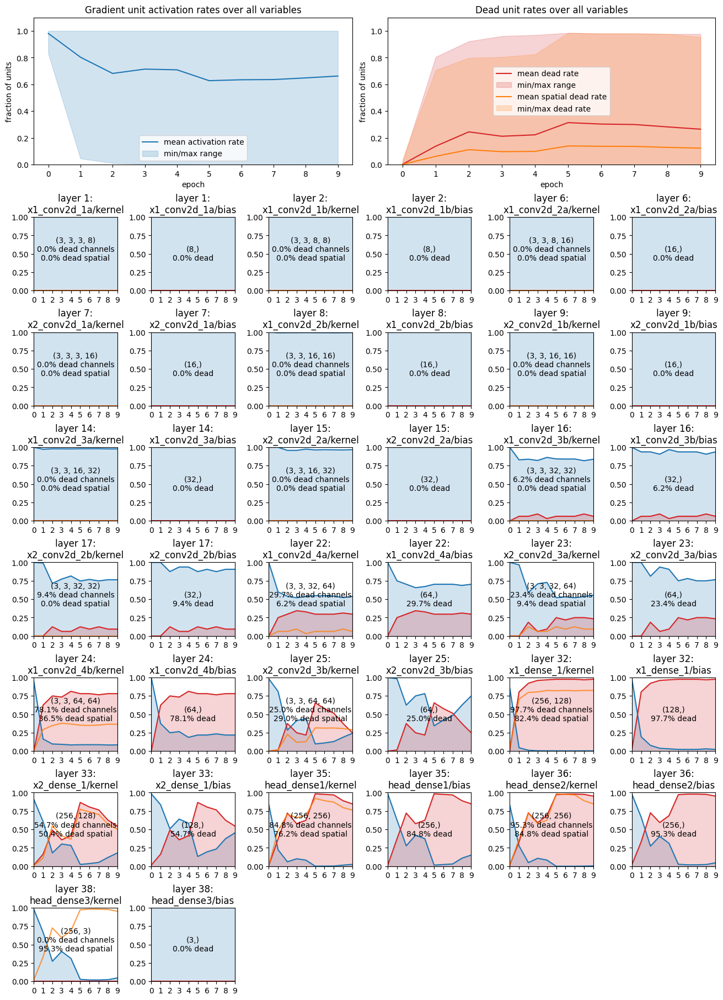

In [ ]:
tinstr.plot_activity_history(gradients)

**Commentary**

Notice that Dropout didn't change much.

Our network is _not_ suffering from having a higher capacity than it needs. The network is _not_ killing neurons in order to reduce redundency.

For fun, we can see more directly what dropout is doing by plotting the activity rates of each layer's outputs. For example, it seems to have no effect on activation rates or dead rates for most layers, as predicted earlier for layers with already low activation rates. On the very first dropout layer you can see that it reduces activation rates by about 20%.

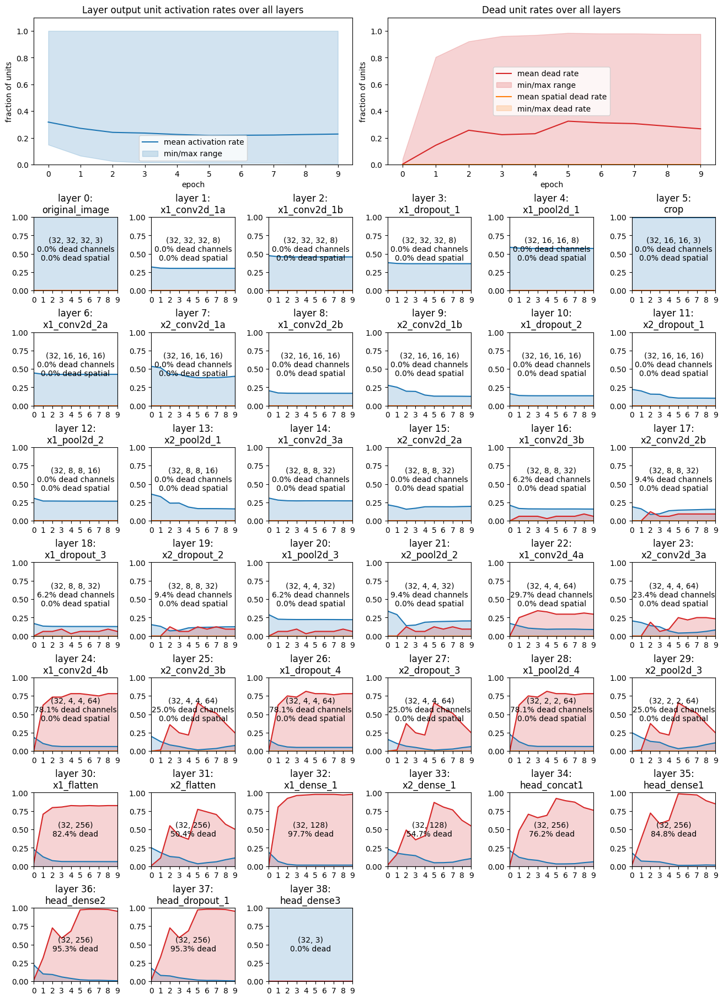

In [ ]:
tinstr.plot_activity_history(outputs)

## Solution 2 - Batch Normalization
For comparison, here we'll apply Batch Normalization in more or less the same places that we added Dropout above, while keeping in mind the prior comment that for our purposes we need to _insert_ batch normalisation within the ReLU before its activation function. Thus we'll modify the original network by adding Batch Normalisation as follows:
* before activation function of last conv layer in each conv block
* before activation function of last wide head dense layer.

In [ ]:
def batchnorm_model():
    original_input = tf.keras.Input(shape=(32, 32, 3), name="original_image")
    crop_input = tf.keras.Input(shape=(16, 16, 3), name="crop")

    # A CNN stack for the 32x32 original image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1a')(original_input)
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='linear', padding='same', name='x1_conv2d_1b')(x1)
    x1 = layers.BatchNormalization(name='x1_batchnorm_1')(x1)
    x1 = layers.ReLU(name='x1_relu_1')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_1')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2a')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='linear', padding='same', name='x1_conv2d_2b')(x1)
    x1 = layers.BatchNormalization(name='x1_batchnorm_2')(x1)
    x1 = layers.ReLU(name='x1_relu_2')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_2')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3a')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='linear', padding='same', name='x1_conv2d_3b')(x1)
    x1 = layers.BatchNormalization(name='x1_batchnorm_3')(x1)
    x1 = layers.ReLU(name='x1_relu_3')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_3')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4a')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='linear', padding='same', name='x1_conv2d_4b')(x1)
    x1 = layers.BatchNormalization(name='x1_batchnorm_4')(x1)
    x1 = layers.ReLU(name='x1_relu_4')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_4')(x1)
    x1 = layers.Flatten(name='x1_flatten')(x1)
    x1 = layers.Dense(128, activation='relu', name='x1_dense_1')(x1)

    # Separate CNN stack for the 16x16 cropped input
    # - 16x16x3 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1a')(crop_input)
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='linear', padding='same', name='x2_conv2d_1b')(x2)
    x2 = layers.BatchNormalization(name='x2_batchnorm_1')(x2)
    x2 = layers.ReLU(name='x2_relu_1')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_1')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2a')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='linear', padding='same', name='x2_conv2d_2b')(x2)
    x2 = layers.BatchNormalization(name='x2_batchnorm_2')(x2)
    x2 = layers.ReLU(name='x2_relu_2')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_2')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3a')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='linear', padding='same', name='x2_conv2d_3b')(x2)
    x2 = layers.BatchNormalization(name='x2_batchnorm_3')(x2)
    x2 = layers.ReLU(name='x2_relu_3')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_3')(x2)
    x2 = layers.Flatten(name='x2_flatten')(x2)
    x2 = layers.Dense(128, activation='relu', name='x2_dense_1')(x2)

    # Combined path
    # - 128 + 128 -> 256 -> 3 (dx, dy, da)
    out = layers.Concatenate(name='head_concat1')([x1, x2])
    out = layers.Dense(256, activation='relu', name='head_dense1')(out)
    out = layers.Dense(256, activation='linear', name='head_dense2')(out)
    out = layers.BatchNormalization(name='head_batchnorm_1')(out)
    out = layers.ReLU(name='head_relu_1')(out)
    out = layers.Dense(3, activation='linear', name='head_dense3')(out)

    return tf.keras.Model(inputs=[original_input, crop_input], outputs=out)

# Print off model summary
batchnorm_model().summary()

Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ original_image            │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1a (Conv2D)     │ (None, 32, 32, 8)      │            224 │ original_image[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1b (Conv2D)     │ (None, 32, 32, 8)      │            584 │ x1_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_batchnorm_1            │ (None, 32, 32, 8)      │             32 │ x1_conv2d_1b[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_relu_1 (ReLU)          │ (None, 32, 32, 8)      │              0 │ x1_batchnorm_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_1               │ (None, 16, 16, 8)      │              0 │ x1_relu_1[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ crop (InputLayer)         │ (None, 16, 16, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2a (Conv2D)     │ (None, 16, 16, 16)     │          1,168 │ x1_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1a (Conv2D)     │ (None, 16, 16, 16)     │            448 │ crop[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x1_conv2d_2a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x2_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_batchnorm_2            │ (None, 16, 16, 16)     │             64 │ x1_conv2d_2b[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_batchnorm_1            │ (None, 16, 16, 16)     │             64 │ x2_conv2d_1b[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_relu_2 (ReLU)          │ (None, 16, 16, 16)     │              0 │ x1_batchnorm_2[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_relu_1 (ReLU)          │ (None, 16, 16, 16)     │              0 │ x2_batchnorm_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_2               │ (None, 8, 8, 16)       │              0 │ x1_relu_2[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_pool2d_1          

 Total params: 345,787 (1.32 MB)

 Trainable params: 344,811 (1.32 MB)

 Non-trainable params: 976 (3.81 KB)

In [ ]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = dropout_model(dropout_rate=0.2)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=10, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.0320
Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step - loss: 0.0318
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0318
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.0318
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0318
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318
Epoch 9/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0318
Epoch 10/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0318


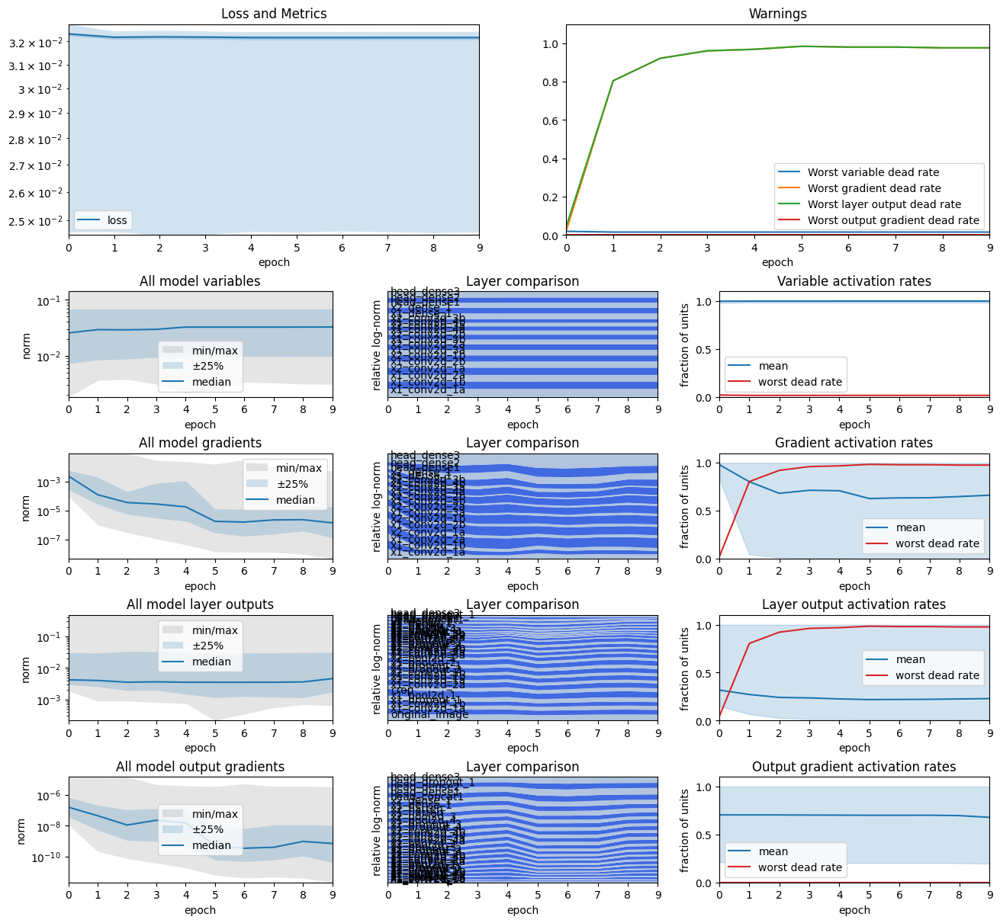

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

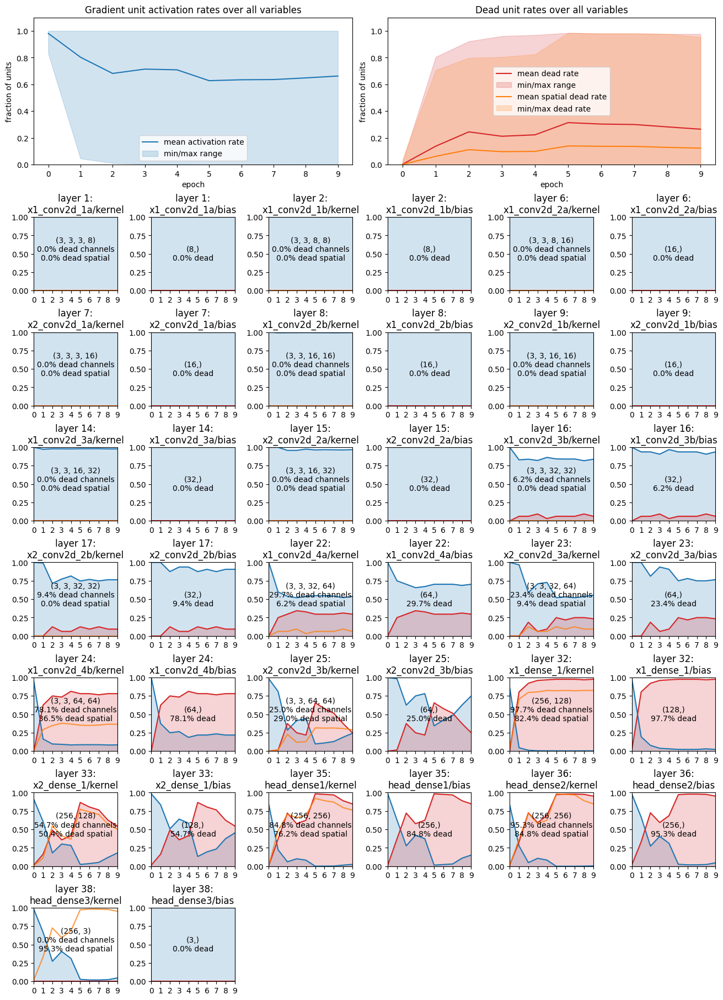

In [ ]:
tinstr.plot_activity_history(gradients)

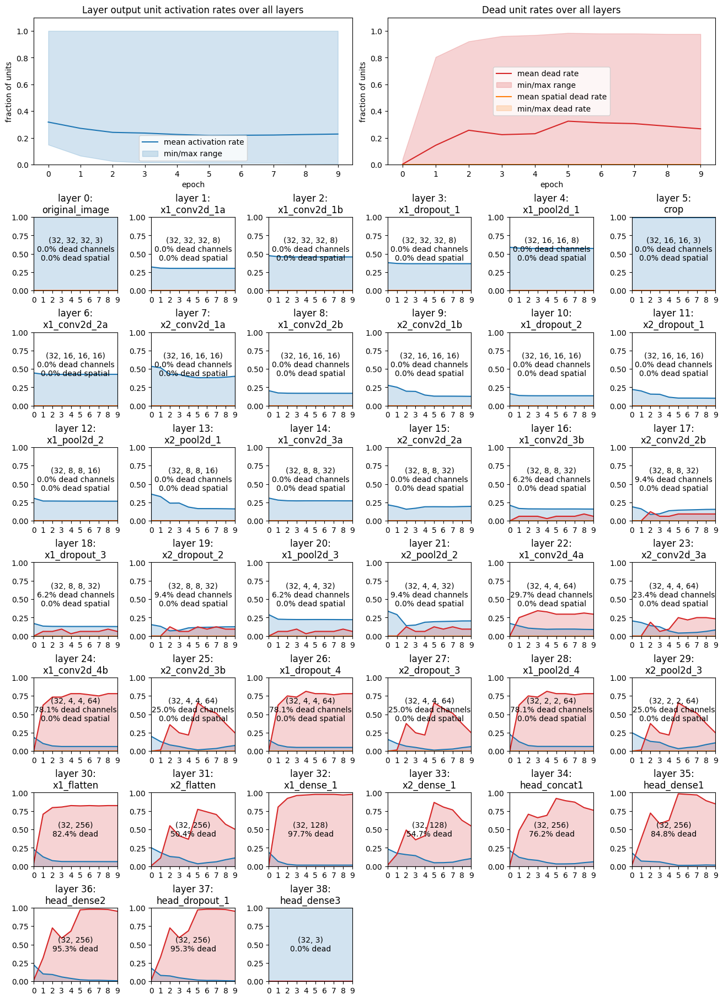

In [ ]:
tinstr.plot_activity_history(outputs)

**Commentary**

* Once again, we really haven't changed anything. You might find a few subtle differences between the plots of the batchnorm model and our original, but those differences are likely just from the random variation between runs. The overall trend is still very bad, and the network reaches close to 100% neuron death in some layers very quickly.

## Solution 3 - Simpler model
Sometimes a simpler model can help reduce the rate of neuron death. It's unlikely to ultimately improve the loss, but it should be much harder for the model to kill of its neurons.

Let's try one variant...

In [ ]:
def simpler_conv_model():
    original_input = tf.keras.Input(shape=(32, 32, 3), name="original_image")
    crop_input = tf.keras.Input(shape=(16, 16, 3), name="crop")

    # A CNN stack for the 32x32 original image
    # - 32x32x3 -> 16x16x32 -> 8x8x64 -> 4096 -> 128
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1')(original_input)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_1')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_2')(x1)
    x1 = layers.Flatten(name='x1_flatten')(x1)
    x1 = layers.Dense(128, activation='relu', name='x1_dense_1')(x1)

    # Separate CNN stack for the 16x16 cropped input
    # - 16x16x3 -> 8x8x32 -> 4x4x64 -> 1024 -> 128
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1')(crop_input)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_1')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_2')(x2)
    x2 = layers.Flatten(name='x2_flatten')(x2)
    x2 = layers.Dense(128, activation='relu', name='x2_dense_1')(x2)

    # Combine feature vectors
    # - 128 + 128 -> 256 -> 3 (dx, dy, da)
    out = layers.Concatenate(name='head_concat1')([x1, x2])
    out = layers.Dense(3, activation='linear', name='head_dense1')(out)

    return tf.keras.Model(inputs=[original_input, crop_input], outputs=out)

simpler_conv_model().summary()

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ original_image            │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ crop (InputLayer)         │ (None, 16, 16, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1 (Conv2D)      │ (None, 32, 32, 32)     │            896 │ original_image[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1 (Conv2D)      │ (None, 16, 16, 32)     │            896 │ crop[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_1               │ (None, 16, 16, 32)     │              0 │ x1_conv2d_1[0][0]      │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_pool2d_1               │ (None, 8, 8, 32)       │              0 │ x2_conv2d_1[0][0]      │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2 (Conv2D)      │ (None, 16, 16, 64)     │         18,496 │ x1_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_2 (Conv2D)      │ (None, 8, 8, 64)       │         18,496 │ x2_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_2               │ (None, 8, 8, 64)       │              0 │ x1_conv2d_2[0][0]      │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_pool2d_2               │ (None, 4, 4, 64)       │              0 │ x2_conv2d_2[0][0]      │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_flatten (Flatten)      │ (None, 4096)           │              0 │ x1_pool2d_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_flatten (Flatten)      │ (None, 1024)           │              0 │ x2_pool2d_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_dense_1 (Dense)        │ (None, 128)            │        524,416 │ x1_flatten[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_dense_1 (Dense)        │ (None, 128)            │        131,200 │ x2_flatten[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ head_concat1              │ (None, 256)            │              0 │ x1_dense_1[0][0],      │
│ (Concatenate)             │                        │                │ x2_dense_1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ head_dense1 (Dense)       │ (None, 3)              │            771 │ head_concat1[0][0]     │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 695,171 (2.65 MB)

 Trainable params: 695,171 (2.65 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = simpler_conv_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=10, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0718
Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0302
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0289
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0279
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0271
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0258
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0243
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0223
Epoch 9/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0217
Epoch 10/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0201


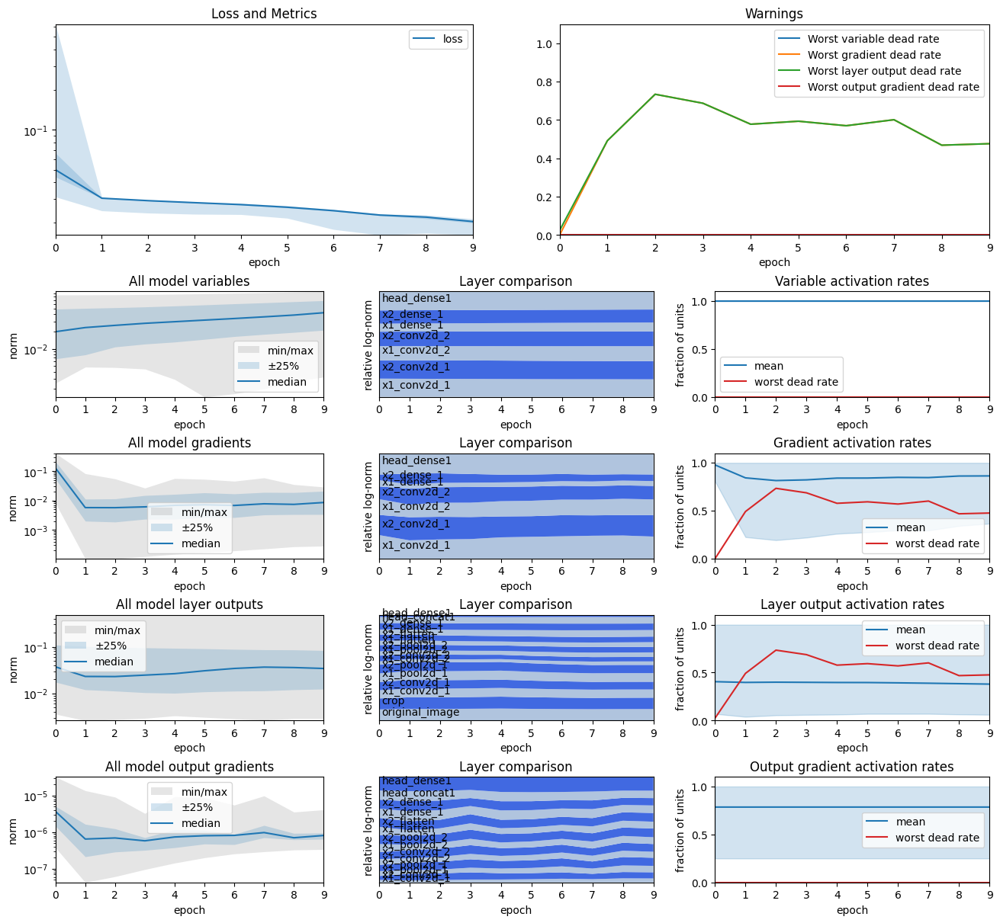

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

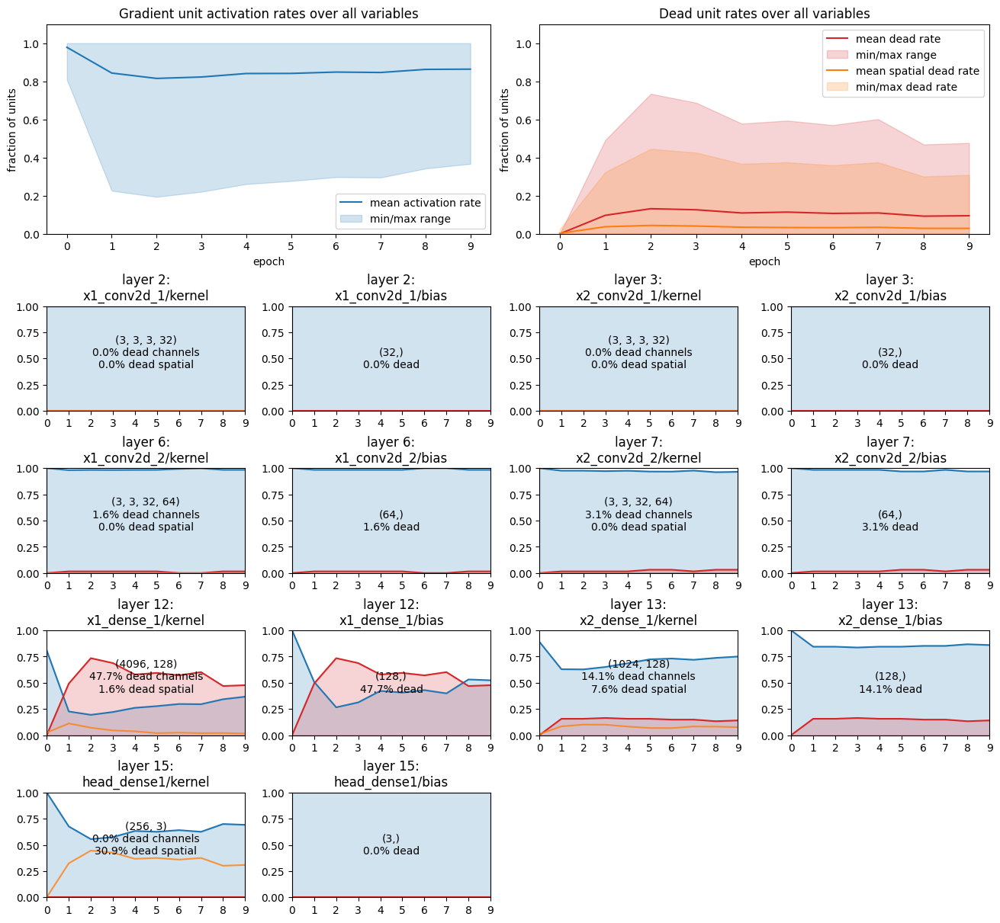

In [ ]:
tinstr.plot_activity_history(gradients)

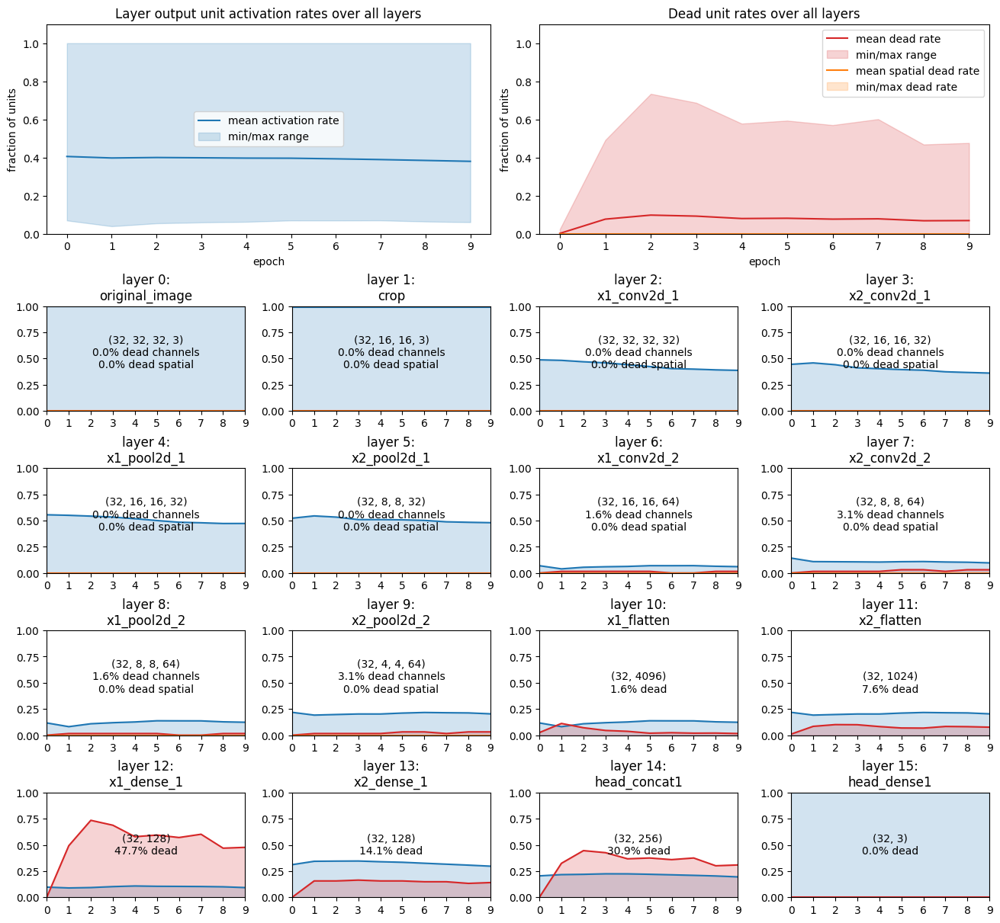

In [ ]:
tinstr.plot_activity_history(outputs)

**Commentary**

* Firstly, I must admit that I stretched the idea of "simpler" a little here. The code in this model is simpler - there's fewer layers. You might also notice that its per-epoch training time is reduced. There's less computation required. However this "simpler" model has about twice the number of parameters as the first model. That's because it stops downsampling at a higher resolution, so the final dense layers have more values to take into account.
* More importantly, the higher resolution at the informational bottleneck means that there's more global spatial information preserved, and the network has a better chance of succeeding.
* Considering that with the training curve, one might think that the model just needs more training time and it will eventually switch and suddenly start training well - as can be common for network training.
* However, notice that the neuron death rate still gets to around 50% for some layers.

Let's train for longer and see. We'll also reduce what's being captured to speed up the training time.

In [ ]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback(value_stats=False)
gradients = tinstr.GradientHistoryCallback(value_stats=False)
outputs = tinstr.LayerOutputHistoryCallback(value_stats=False)
output_gradients = tinstr.LayerOutputGradientHistoryCallback(value_stats=False)

model = simpler_conv_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=200, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch    20 - 4.62s/epoch: loss: 0.0109  
Epoch    40 - 4.29s/epoch: loss: 0.0029  
Epoch    60 - 4.25s/epoch: loss: 0.0017  
Epoch    80 - 4.28s/epoch: loss: 0.0017  
Epoch   100 - 4.36s/epoch: loss: 0.0011  
Epoch   120 - 4.27s/epoch: loss: 0.0010  
Epoch   140 - 4.23s/epoch: loss: 0.0011  
Epoch   160 - 4.38s/epoch: loss: 0.0009  
Epoch   180 - 4.34s/epoch: loss: 0.0009  
Epoch   200 - 4.33s/epoch: loss: 0.0008  
Total training time: 867.1 sec


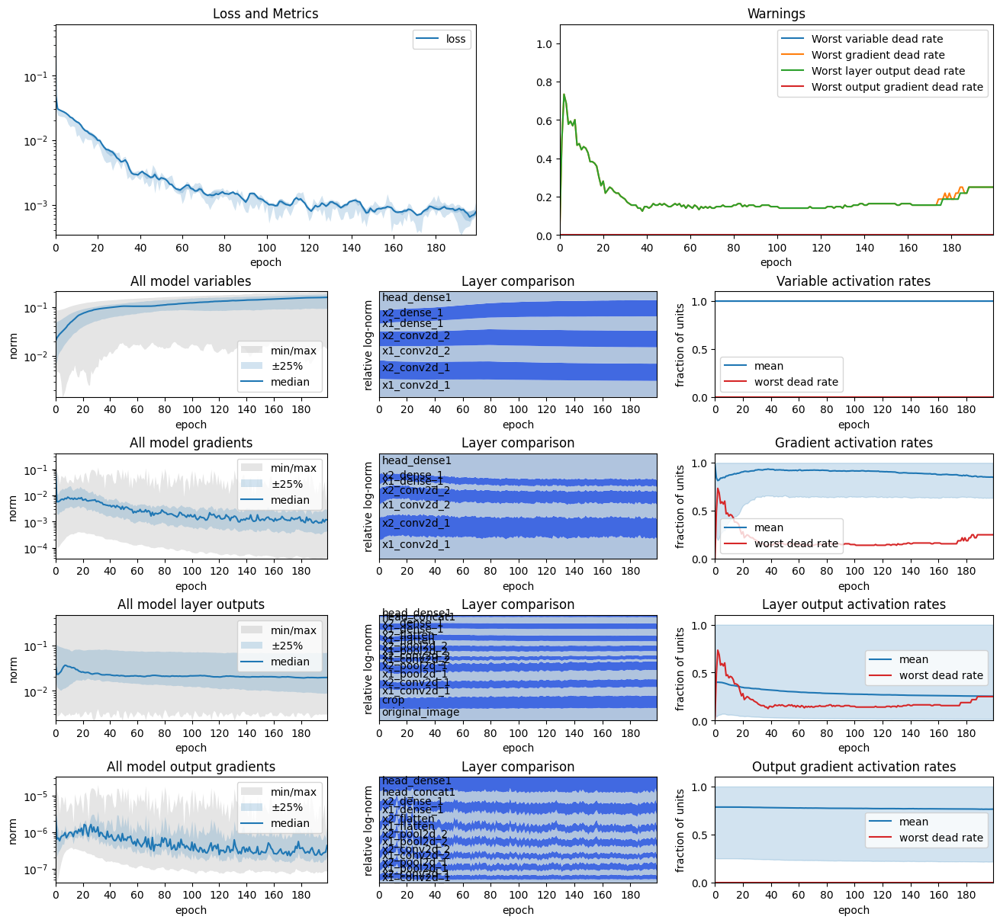

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

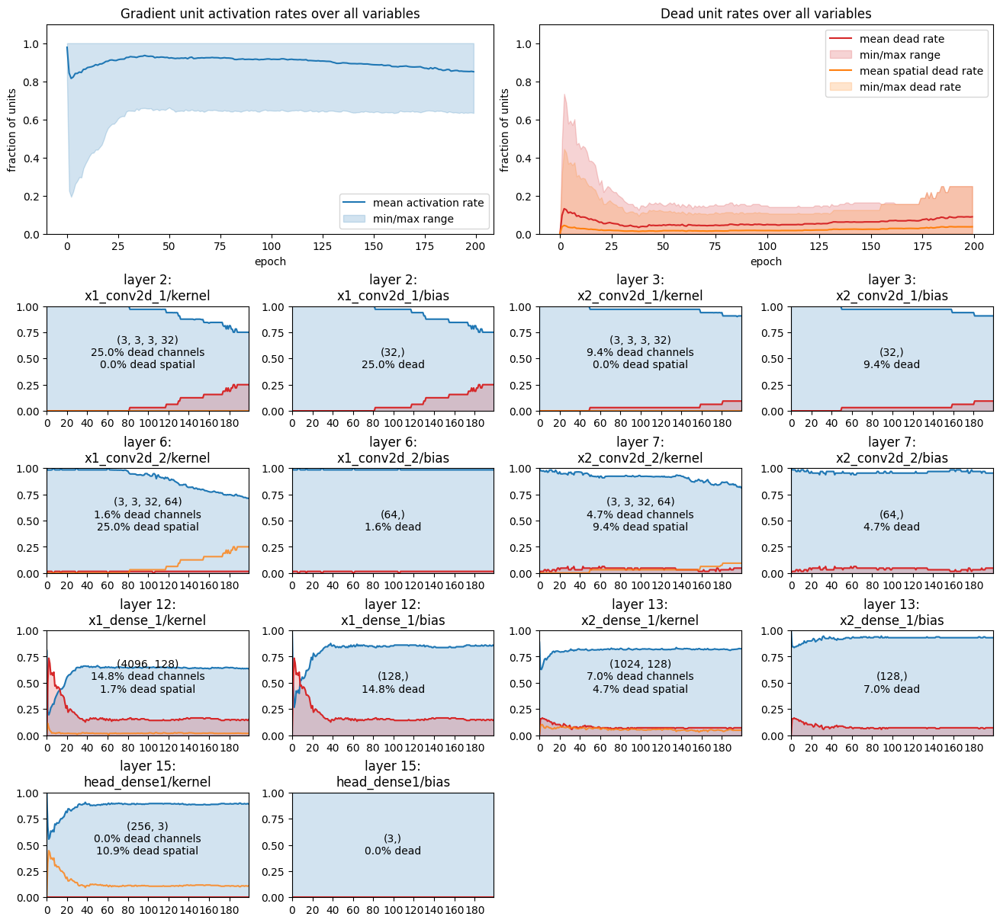

In [ ]:
tinstr.plot_activity_history(gradients)

**Commentary**
* This model finally works....on this occurence.
* However, in preparing this notebook I originally ran this model without a fixed random seed and that time it failed to reduce the loss. So it's not stable.

## Solution #4 - Coord Conv
In this last solution experiment we'll add explicit spatial encoding in the form of the CoordConv layer suggested by [Liu et al (2016)](https://arxiv.org/abs/1807.03247v2).

A full working image alignment model would be considerably different to the one we're using here. So for the present purposes I'll simply add the Coord Conv layer directly to the input and leave the network to attempt to do the right thing with that information.

In [ ]:
# CoordConv layer
# Based on R. Liu et al., “An Intriguing Failing of CNNs and the CoordConv Solution,” NeurIPS 2018
# https://arxiv.org/abs/1807.03247
class CoordConv(layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, inputs):
        # inputs.shape => [batch_size, height, width, channels]
        batch_size, height, width, channels = tf.unstack(tf.shape(inputs))

        # Generate a coordinate grid:
        # - x_coords: shape (width,) from -0.5 to 0.5
        # - y_coords: shape (height,) from -0.5 to 0.5
        x_coords = tf.linspace(-0.5, 0.5, width)
        y_coords = tf.linspace(-0.5, 0.5, height)

        # Use meshgrid to get 2D coordinate maps
        # - xx, yy shape => (height, width)
        xx, yy = tf.meshgrid(x_coords, y_coords)

        # Reshape for appending as channels
        xx = tf.expand_dims(xx, axis=-1)  # (height, width, 1)
        yy = tf.expand_dims(yy, axis=-1)  # (height, width, 1)

        # Tile across batch dimension
        xx_tiled = tf.tile(tf.expand_dims(xx, 0), [batch_size, 1, 1, 1])
        yy_tiled = tf.tile(tf.expand_dims(yy, 0), [batch_size, 1, 1, 1])

        # Concatenate to inputs along the channel dimension
        # outputs.shape => [batch_size, height, width, channels+2]
        output = tf.concat([inputs, xx_tiled, yy_tiled], axis=-1)
        return output

# example
input = tf.keras.Input(shape=(32, 32, 3))
cc = CoordConv()(input)
print(f"Input shape:      {input.shape}")
print(f"CoordConv output: {cc.shape}")

Input shape:      (None, 32, 32, 3)
CoordConv output: (None, 32, 32, 5)


In [ ]:
def coordconv_model():
    original_input = tf.keras.Input(shape=(32, 32, 3), name="original_image")
    crop_input = tf.keras.Input(shape=(16, 16, 3), name="crop")

    # A CNN stack for the 32x32 original image
    # - 32x32x3 -> 32x32x5 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x1 = CoordConv(name="x1_coordconv_1")(original_input)
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1a')(x1)
    x1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_1b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_1')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2a')(x1)
    x1 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_2b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_2')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3a')(x1)
    x1 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_3b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_3')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4a')(x1)
    x1 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x1_conv2d_4b')(x1)
    x1 = layers.MaxPooling2D(pool_size=2, name='x1_pool2d_4')(x1)
    x1 = layers.Flatten(name='x1_flatten')(x1)
    x1 = layers.Dense(128, activation='relu', name='x1_dense_1')(x1)

    # Separate CNN stack for the 16x16 cropped input
    # - 16x16x3 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256 -> 128
    x2 = CoordConv(name="x2_coordconv_1")(crop_input)
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1a')(x2)
    x2 = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_1b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_1')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2a')(x2)
    x2 = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_2b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_2')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3a')(x2)
    x2 = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='x2_conv2d_3b')(x2)
    x2 = layers.MaxPooling2D(pool_size=2, name='x2_pool2d_3')(x2)
    x2 = layers.Flatten(name='x2_flatten')(x2)
    x2 = layers.Dense(128, activation='relu', name='x2_dense_1')(x2)

    # Combined path
    # - 128 + 128 -> 256 -> 3 (dx, dy, da)
    out = layers.Concatenate(name='head_concat1')([x1, x2])
    out = layers.Dense(256, activation='relu', name='head_dense1')(out)
    out = layers.Dense(256, activation='relu', name='head_dense2')(out)
    out = layers.Dense(3, activation='linear', name='head_dense3')(out)

    return tf.keras.Model(inputs=[original_input, crop_input], outputs=out)

# Print off model summary
coordconv_model().summary()

Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ original_image            │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_coordconv_1            │ (None, 32, 32, 5)      │              0 │ original_image[0][0]   │
│ (CoordConv)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1a (Conv2D)     │ (None, 32, 32, 8)      │            368 │ x1_coordconv_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_1b (Conv2D)     │ (None, 32, 32, 8)      │            584 │ x1_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ crop (InputLayer)         │ (None, 16, 16, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_1               │ (None, 16, 16, 8)      │              0 │ x1_conv2d_1b[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_coordconv_1            │ (None, 16, 16, 5)      │              0 │ crop[0][0]             │
│ (CoordConv)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2a (Conv2D)     │ (None, 16, 16, 16)     │          1,168 │ x1_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1a (Conv2D)     │ (None, 16, 16, 16)     │            736 │ x2_coordconv_1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_2b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x1_conv2d_2a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_1b (Conv2D)     │ (None, 16, 16, 16)     │          2,320 │ x2_conv2d_1a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_pool2d_2               │ (None, 8, 8, 16)       │              0 │ x1_conv2d_2b[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_pool2d_1               │ (None, 8, 8, 16)       │              0 │ x2_conv2d_1b[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_3a (Conv2D)     │ (None, 8, 8, 32)       │          4,640 │ x1_pool2d_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_2a (Conv2D)     │ (None, 8, 8, 32)       │          4,640 │ x2_pool2d_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x1_conv2d_3b (Conv2D)     │ (None, 8, 8, 32)       │          9,248 │ x1_conv2d_3a[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ x2_conv2d_2b (Conv2D)

 Total params: 344,267 (1.31 MB)

 Trainable params: 344,267 (1.31 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = coordconv_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='mse')
dataset = prepared_dataset().take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=10, callbacks=[variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0320


Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0317
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0314
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.0314
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0314
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0313
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0312
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0310
Epoch 9/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.0307
Epoch 10/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.0304


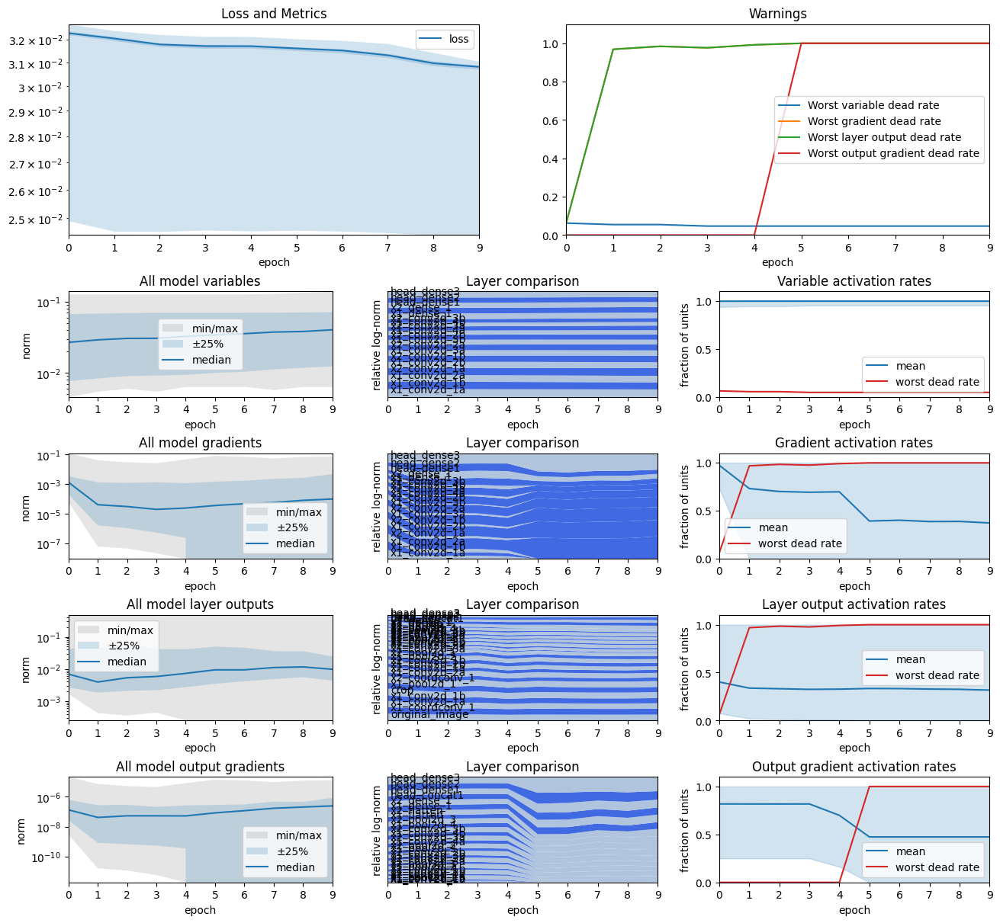

In [ ]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

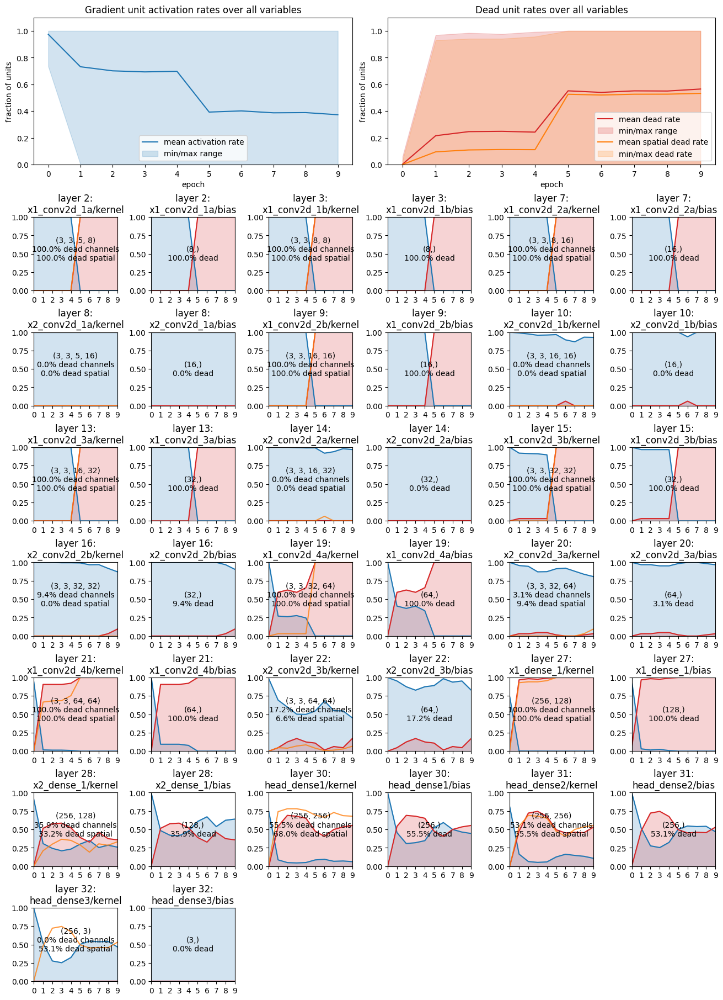

In [ ]:
tinstr.plot_activity_history(gradients)

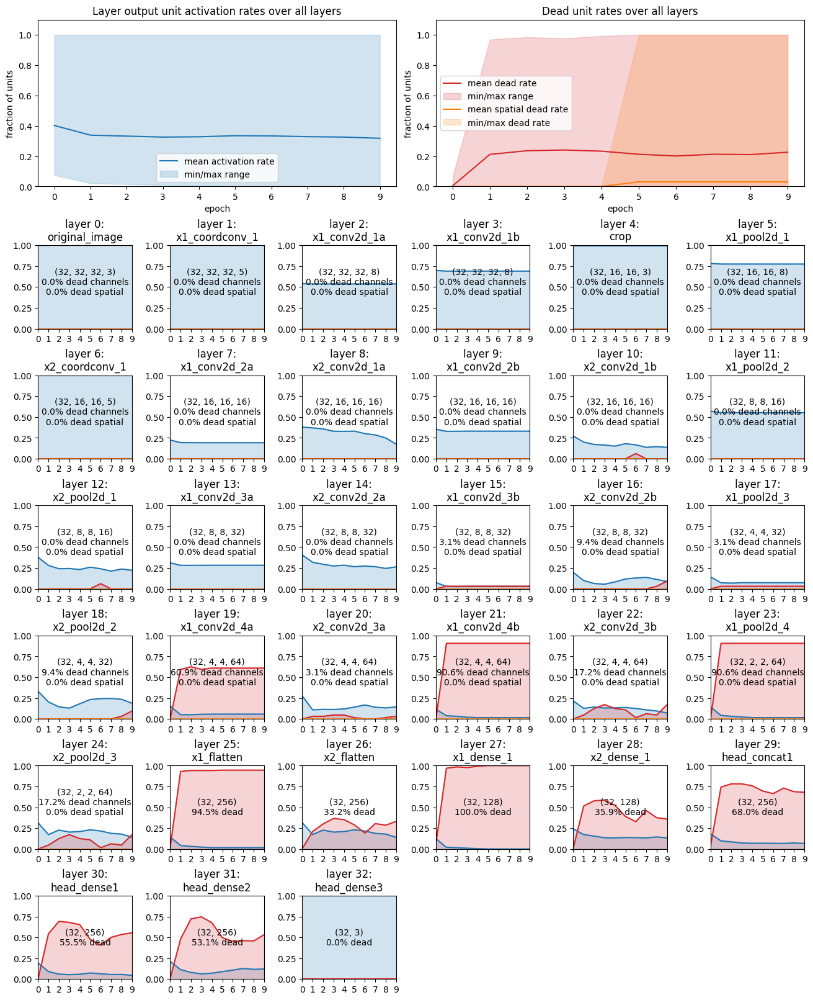

In [ ]:
tinstr.plot_activity_history(outputs)

**Commentary**

As mentioned already, it turns out that image alignment is a very difficult problem. Merely adding spatial information into the first layer isn't enough. In preparing this notebook I spun up a side experiment where I tried all sorts of model architectures, including using self-attention and cross-attention layers. None of them worked.

## Appendix: Comparison to Image Classification
Before finally wrapping up, I wanted to show the kind of results you'd expect from a "well behaved" model.

So, by way of comparison, let's look at how the activity plots behave on a successful training of a similar model, but for image classification.

This uses the same basic dataset, but in its original classification form. And it uses the same basic model, but with only one input arm instead of two and the outputs map to logits for the 10 possible classes.

In [12]:
def classification_model():
    image_input = tf.keras.Input(shape=(32, 32, 3), name="image_input")

    # A CNN stack against the 32x32 image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1a')(image_input)
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_1')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2a')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_2')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3a')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_3')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2d_4a')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2d_4b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_4')(x)
    x = layers.Flatten(name='flatten')(x)

    # Combined path
    # - 128 -> 256 -> 10 (classes)
    out = layers.Dense(128, activation='relu', name='dense_1')(x)
    out = layers.Dense(256, activation='relu', name='dense_2')(out)
    out = layers.Dense(256, activation='relu', name='dense_3')(out)
    out = layers.Dense(10, activation='linear', name='dense_4')(out)  # logits output

    return tf.keras.Model(inputs=image_input, outputs=out)

# Print off model summary
classification_model().summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)        │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1a (Conv2D)              │ (None, 32, 32, 8)      │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1b (Conv2D)              │ (None, 32, 32, 8)      │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_1 (MaxPooling2D)         │ (None, 16, 16, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2a (Conv2D)              │ (None, 16, 16, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2b (Conv2D)              │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_2 (MaxPooling2D)         │ (None, 8, 8, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3a (Conv2D)              │ (None, 8, 8, 32)       │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3b (Conv2D)              │ (None, 8, 8, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_3 (MaxPooling2D)         │ (None, 4, 4, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4a (Conv2D)              │ (None, 4, 4, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4b (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_4 (MaxPooling2D)         │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 207,890 (812.07 KB)

 Trainable params: 207,890 (812.07 KB)

 Non-trainable params: 0 (0.00 B)

In [13]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = classification_model()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch     5 - 8.04s/epoch: accuracy: 0.3232  loss: 1.7259  
Epoch    10 - 3.74s/epoch: accuracy: 0.4598  loss: 1.4410  
Epoch    15 - 3.74s/epoch: accuracy: 0.5598  loss: 1.1968  
Epoch    20 - 4.08s/epoch: accuracy: 0.6620  loss: 0.9078  
Epoch    25 - 3.91s/epoch: accuracy: 0.7652  loss: 0.6783  
Epoch    30 - 3.96s/epoch: accuracy: 0.8505  loss: 0.4229  
Epoch    35 - 3.97s/epoch: accuracy: 0.8800  loss: 0.3452  
Epoch    40 - 3.96s/epoch: accuracy: 0.9105  loss: 0.2669  
Epoch    45 - 4.00s/epoch: accuracy: 0.9277  loss: 0.2191  
Epoch    50 - 3.98s/epoch: accuracy: 0.9420  loss: 0.1837  
Total training time: 217.0 sec


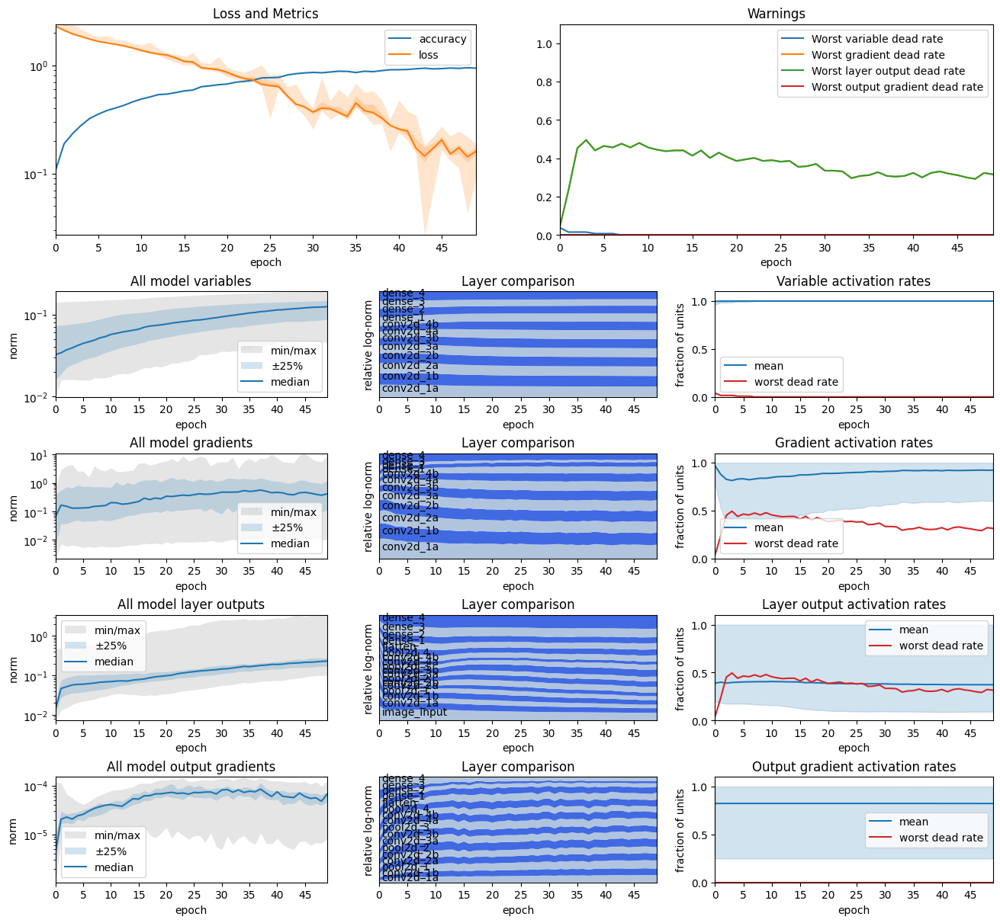

In [14]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

I'll plot all four activity plots because I want them for comparison

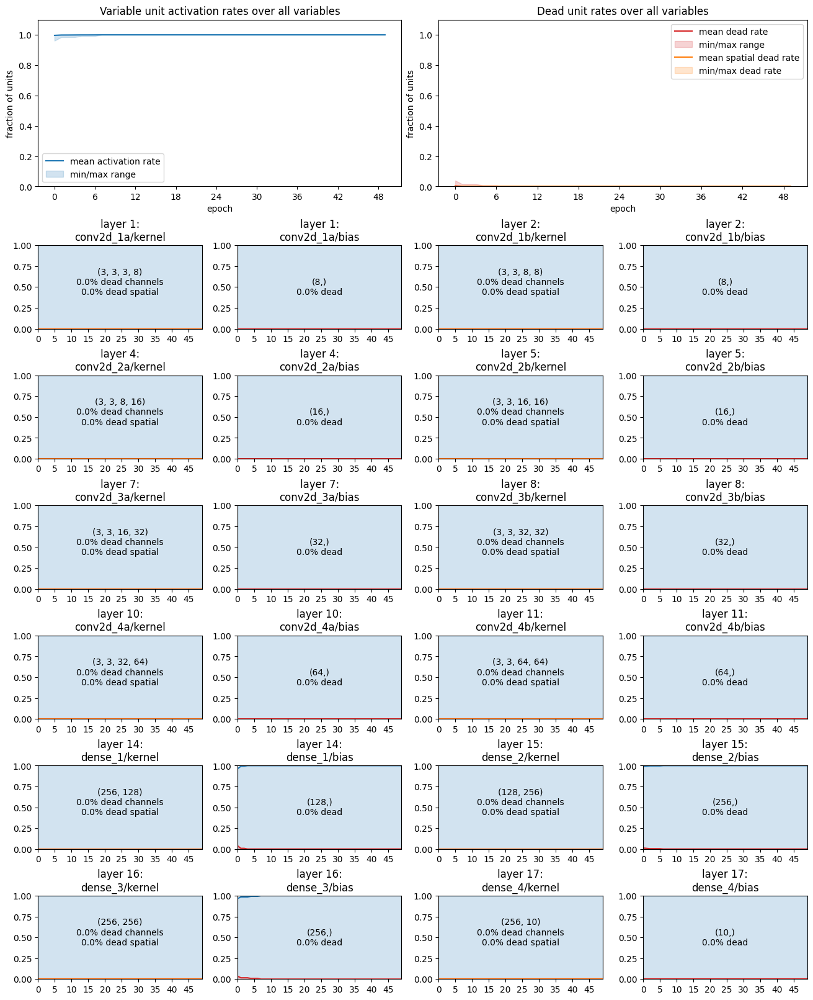

In [15]:
tinstr.plot_activity_history(variables)

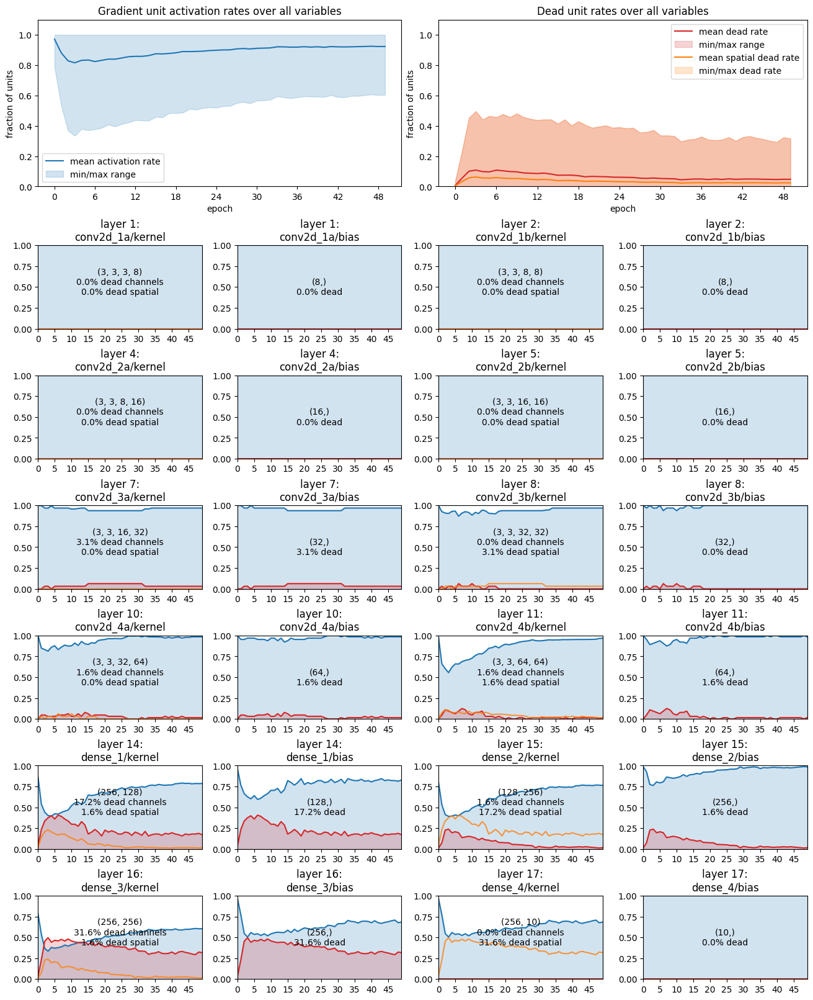

In [16]:
tinstr.plot_activity_history(gradients)

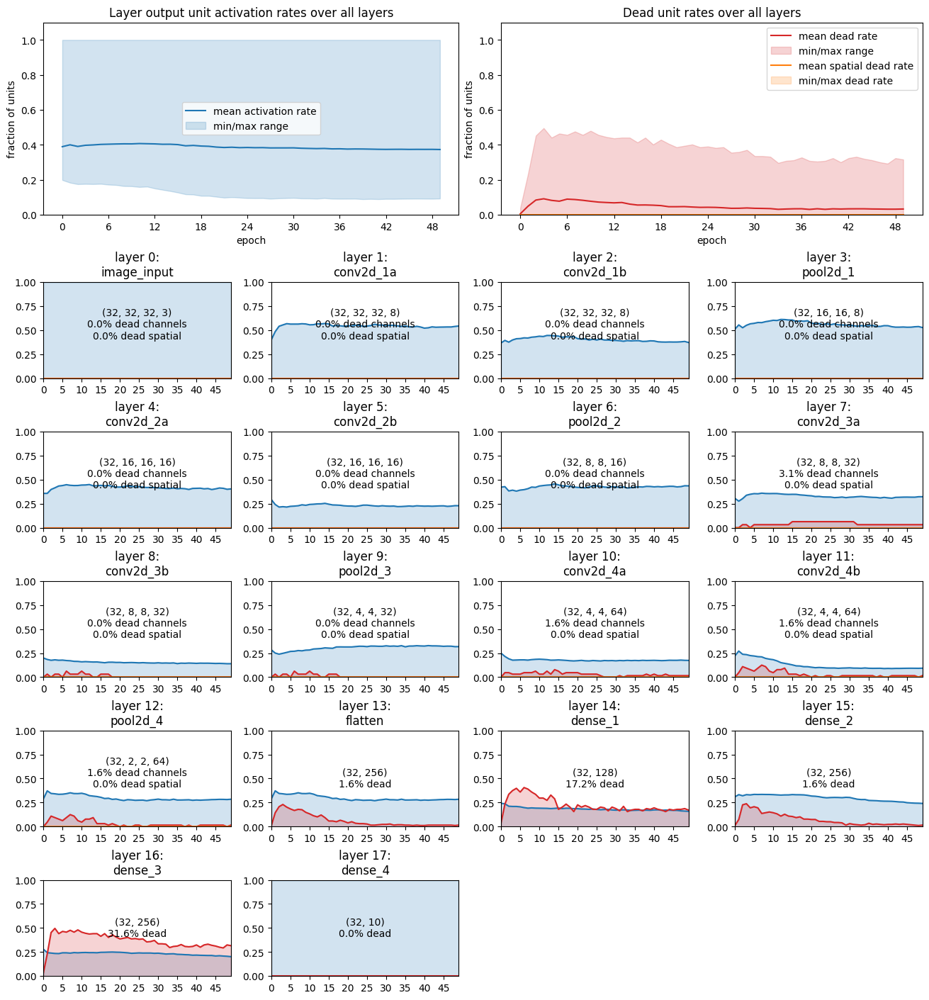

In [17]:
tinstr.plot_activity_history(outputs)

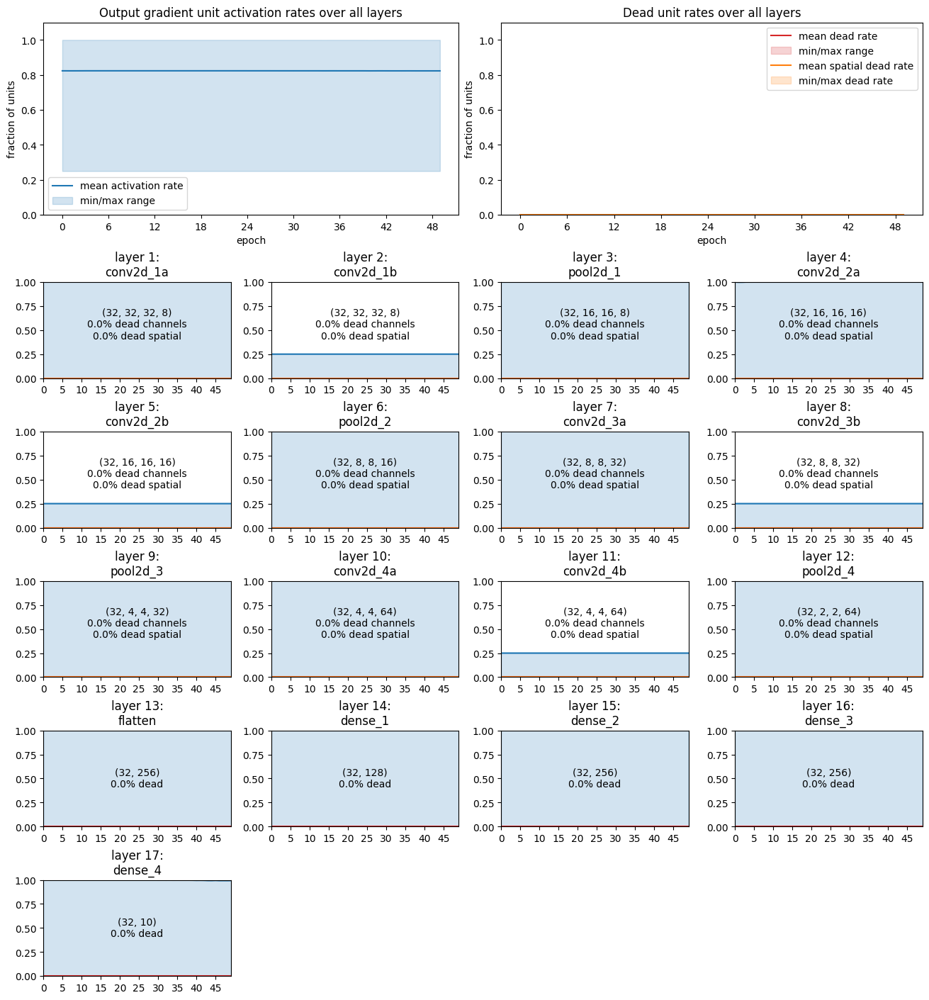

In [18]:
tinstr.plot_activity_history(output_gradients)

**Commentary**

* The model probably needs to train for a bit longer yet, but it is clearly doing well. We'd also want to test it against a validation set to really verify its accuracy.
* There's some neuron death in the later layers, but it's less than 50% for most layers and remains stable overall. Perhaps we don't need the 256 width in the final dense layers, especially given that there's a 128-width informational bottleneck feeding into those last layers, and much of the feature engineering work will have already been performed by the earlier layers.
* For the earliest layers, gradient activation rates remain at or near 100%. This is the most important feature of a healthy network - all weights get optimised.
* It's only in the layer outputs that we see the theory predicted 50% activation rate in the very first layer. The other early layers hover around that mark too.

Let's use this for a comparison to the extreme case earlier, and generate a number of other plots.

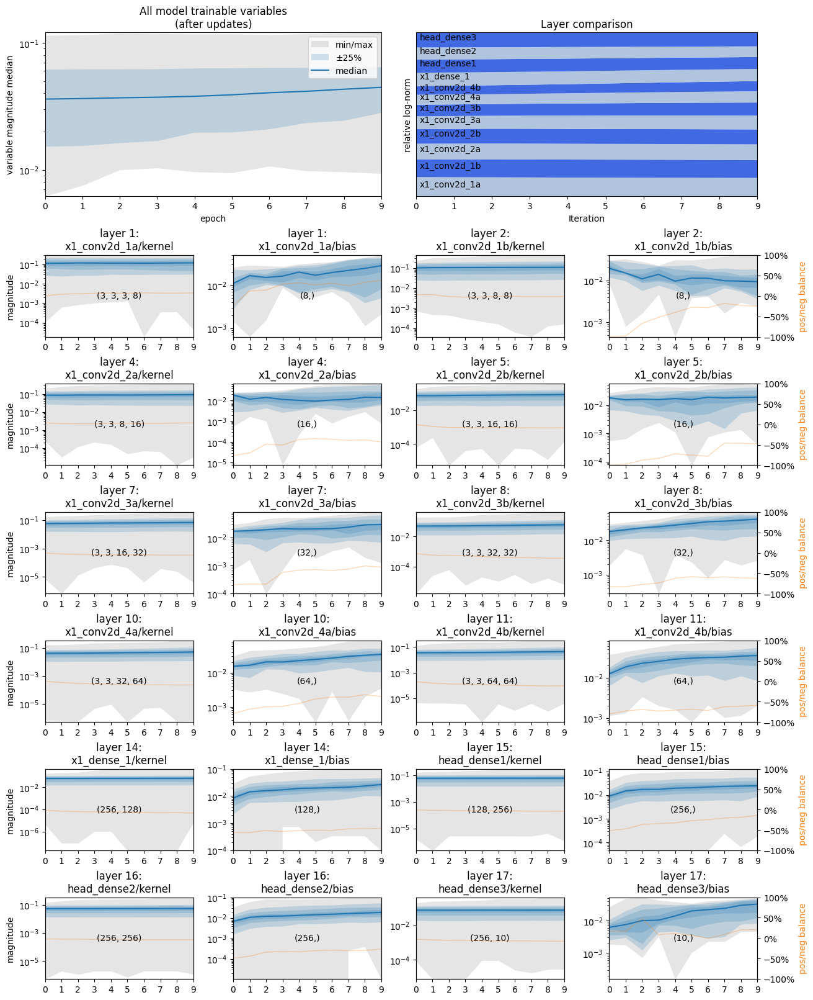

In [ ]:
tinstr.plot_value_history(variables)

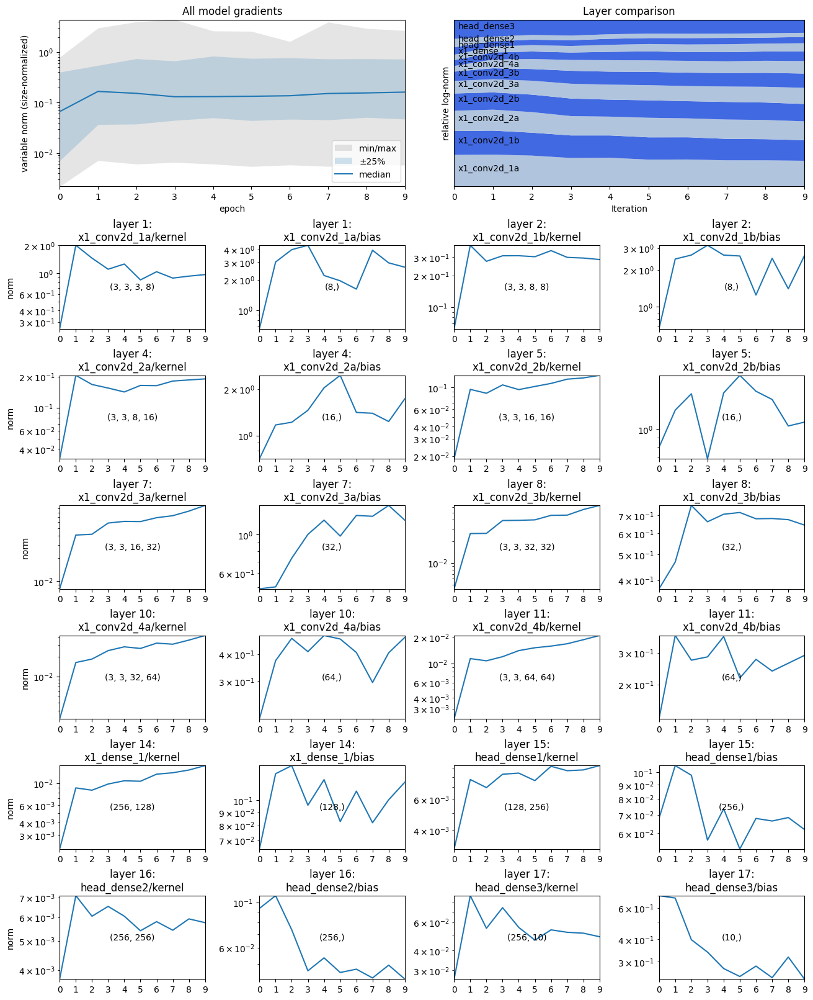

In [ ]:
tinstr.plot_value_history(gradients, show="norms")

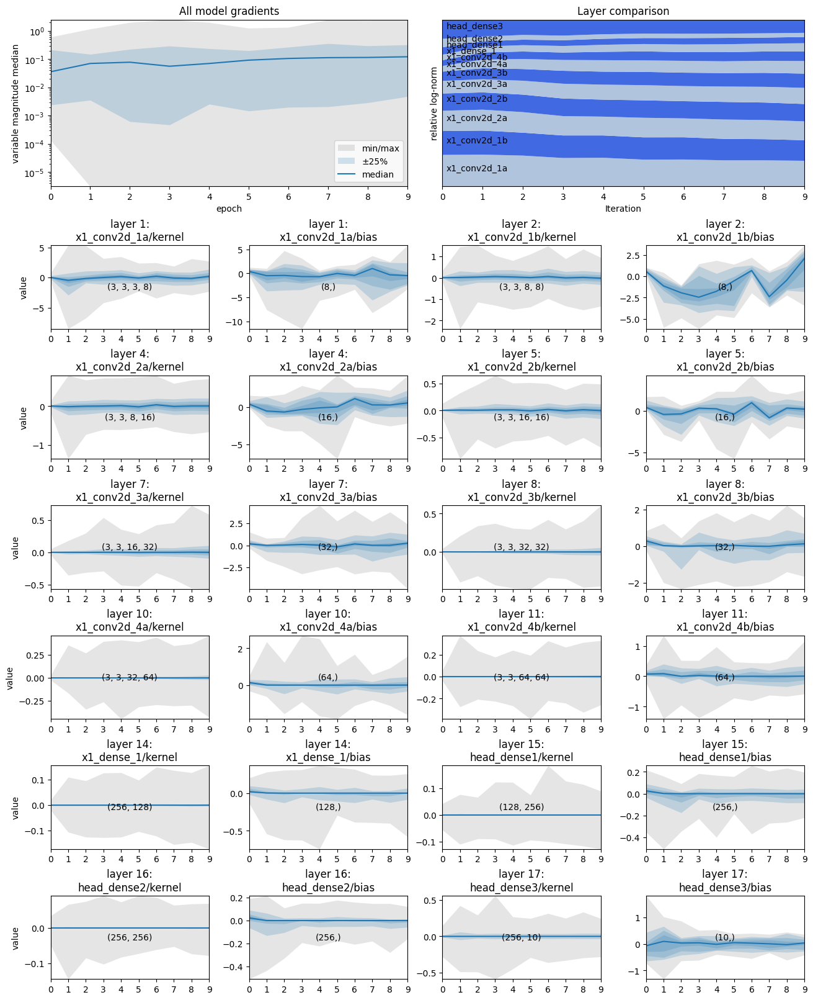

In [ ]:
tinstr.plot_value_history(gradients, show="values")

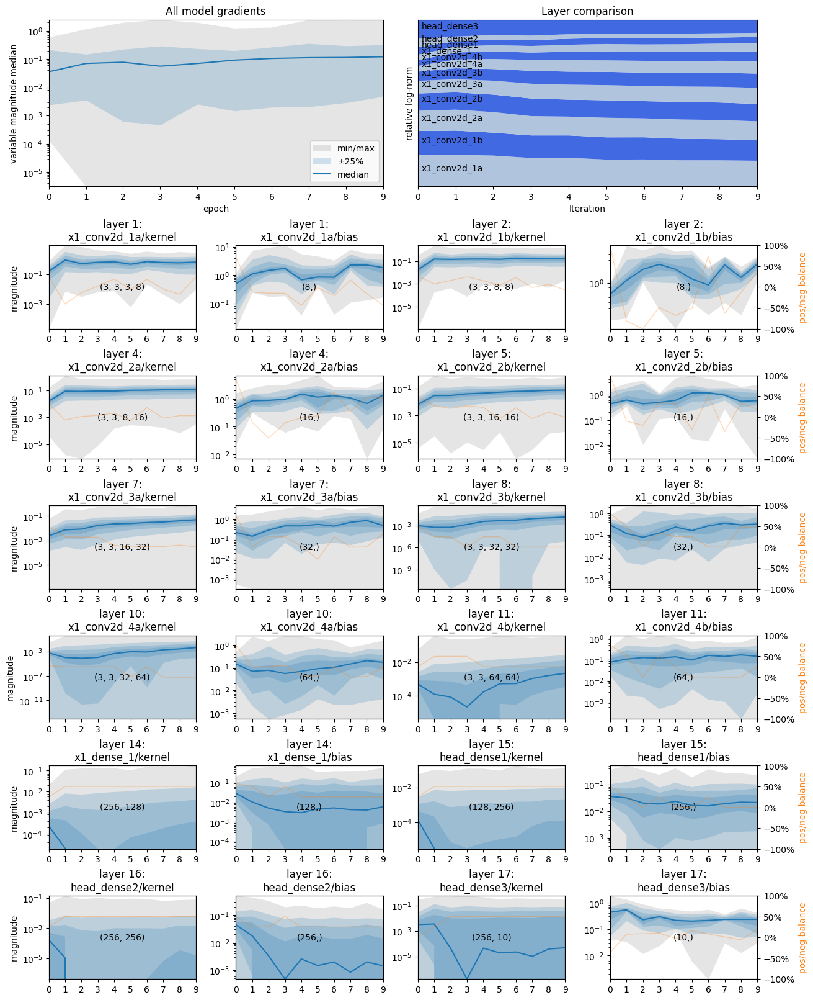

In [ ]:
tinstr.plot_value_history(gradients, show="magnitudes")

## Appendix: Improved Conv Classification Model with Dropout
We also want a model that has very minimal neuron death, to see what a best case could be.

We'll try to customisations of the above model. This first one adds dropout to minimise neuron death in the worst layers. In some experimentation I found that adding dropout _before_ a layer reduces the neuron death in that layer.

The main dropout problems seem to be first two dense layers, and also conv2d_4b.

Additionally, I found that removing that extra 256-width dense layer improved neuron a smidgen on its own. So that's included too.

In [6]:
def classification_model_dropout():
    image_input = tf.keras.Input(shape=(32, 32, 3), name="image_input")

    # A CNN stack against the 32x32 image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1a')(image_input)
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_1')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2a')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_2')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3a')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_3')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2d_4a')(x)
    x = layers.Dropout(0.2, name='dropout_4a')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2d_4b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_4')(x)
    x = layers.Flatten(name='flatten')(x)

    # Classification stack
    # - 256 -> 128 -> 10 (classes)
    out = x
    out = layers.Dropout(0.2, name='dropout_1')(out)
    out = layers.Dense(128, activation='relu', name='dense_1')(out)
    out = layers.Dropout(0.2, name='dropout_2')(out)
    out = layers.Dense(128, activation='relu', name='dense_2')(out)
    #out = layers.Dense(128, activation='relu', name='dense_3')(out)
    out = layers.Dense(10, activation='linear', name='dense_4')(out)  # logits output

    return tf.keras.Model(inputs=image_input, outputs=out)

# Print off model summary
classification_model_dropout().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)        │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1a (Conv2D)              │ (None, 32, 32, 8)      │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1b (Conv2D)              │ (None, 32, 32, 8)      │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_1 (MaxPooling2D)         │ (None, 16, 16, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2a (Conv2D)              │ (None, 16, 16, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2b (Conv2D)              │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_2 (MaxPooling2D)         │ (None, 8, 8, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3a (Conv2D)              │ (None, 8, 8, 32)       │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3b (Conv2D)              │ (None, 8, 8, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_3 (MaxPooling2D)         │ (None, 4, 4, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4a (Conv2D)              │ (None, 4, 4, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4a (Dropout)            │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4b (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_4 (MaxPooling2D)         │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,306 (485.57 KB)

 Trainable params: 124,306 (485.57 KB)

 Non-trainable params: 0 (0.00 B)

In [8]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = classification_model_dropout()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch     5 - 11.40s/epoch: accuracy: 0.3762  loss: 1.6482  
Epoch    10 - 4.19s/epoch: accuracy: 0.4972  loss: 1.3533  
Epoch    15 - 4.57s/epoch: accuracy: 0.5802  loss: 1.1594  
Epoch    20 - 3.98s/epoch: accuracy: 0.6555  loss: 0.9615  
Epoch    25 - 3.95s/epoch: accuracy: 0.7000  loss: 0.8486  
Epoch    30 - 3.92s/epoch: accuracy: 0.7483  loss: 0.6916  
Epoch    35 - 4.07s/epoch: accuracy: 0.7920  loss: 0.5896  
Epoch    40 - 4.24s/epoch: accuracy: 0.8170  loss: 0.5201  
Epoch    45 - 4.11s/epoch: accuracy: 0.8428  loss: 0.4456  
Epoch    50 - 4.08s/epoch: accuracy: 0.8408  loss: 0.4420  
Total training time: 242.6 sec


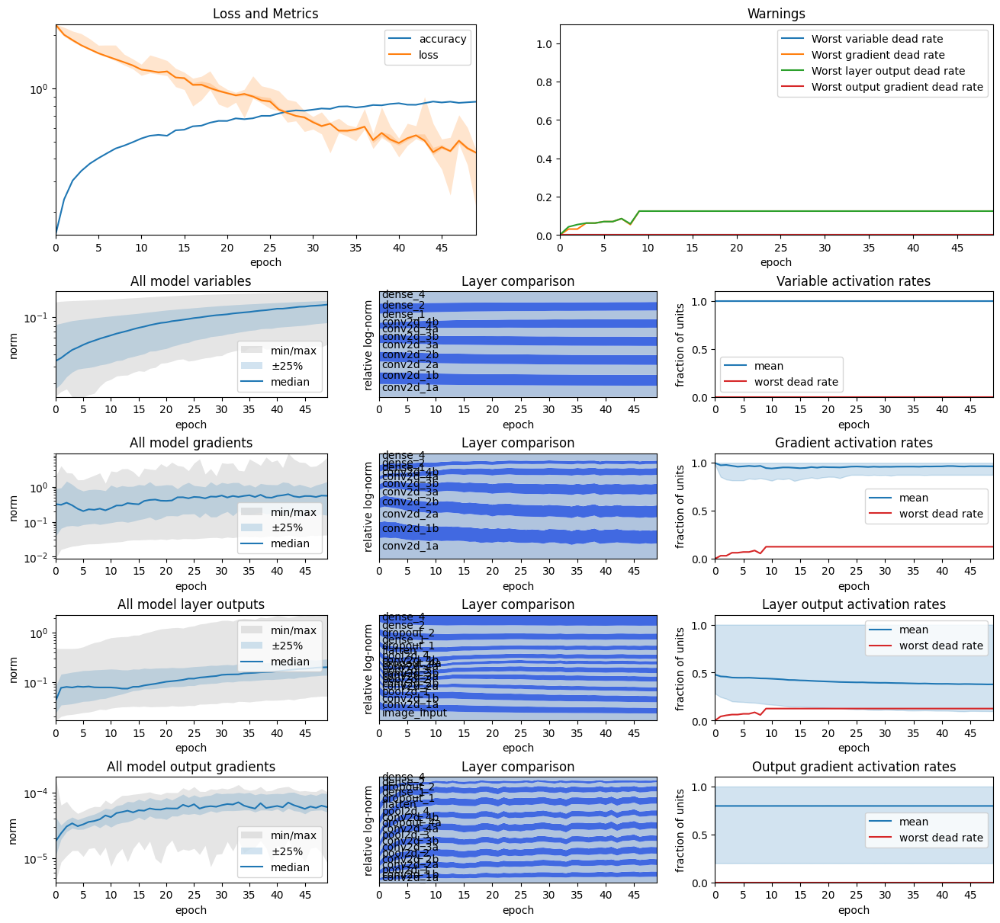

In [9]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

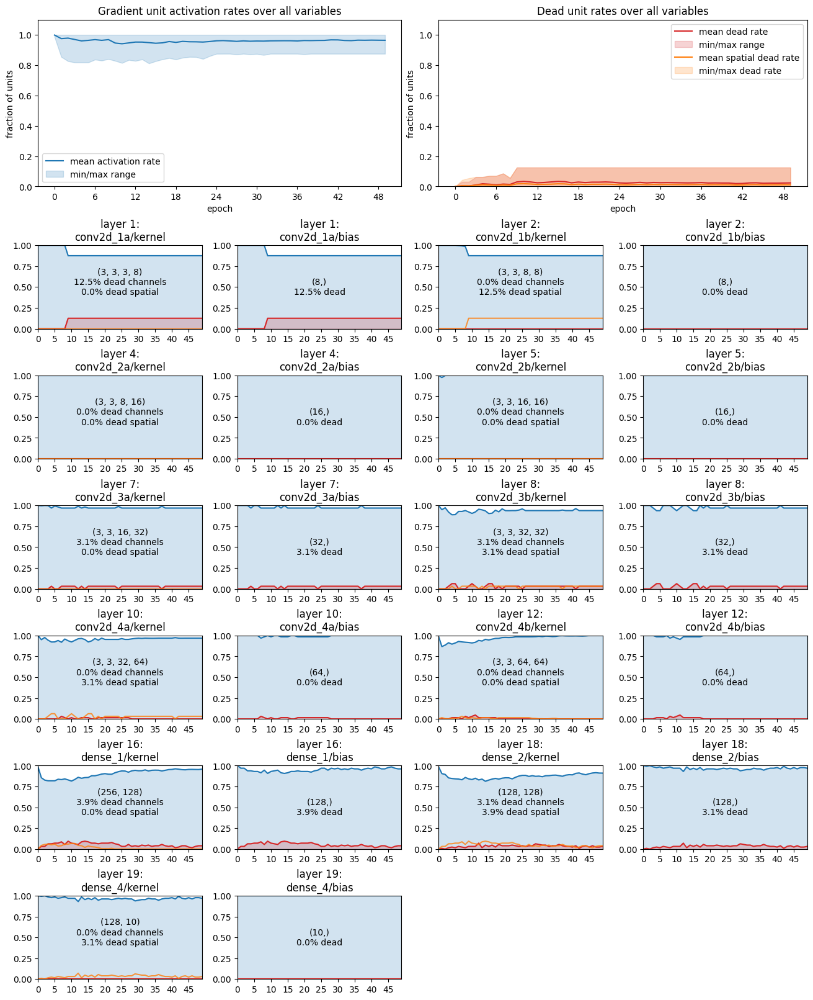

In [10]:
tinstr.plot_activity_history(gradients)

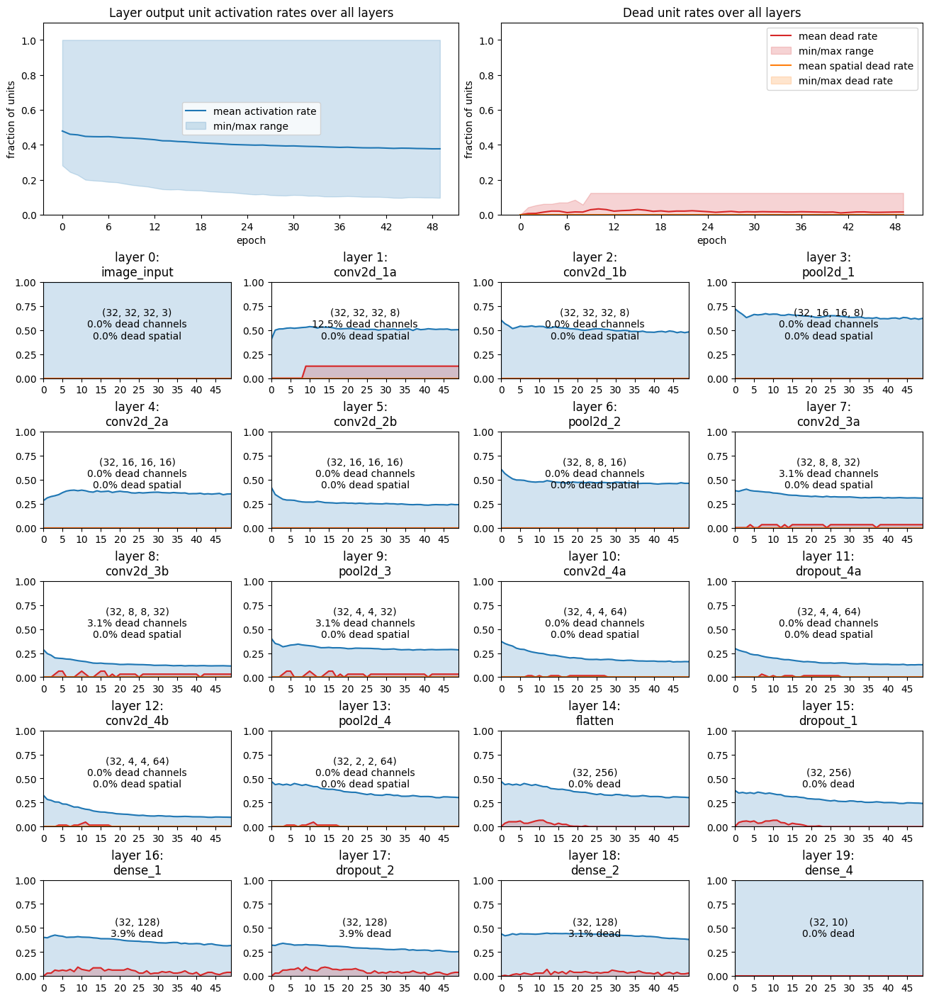

In [11]:
tinstr.plot_activity_history(outputs)

## Appendix: Improved Conv Classification Model with BatchNorm
The alternative is to use BatchNorm. So this version takes the base conv-classification model and uses BatchNorm to reduce neuron death instead.

I've also removed the unwanted 256-dense layer.

In [3]:
def classification_model_batchnorm():
    image_input = tf.keras.Input(shape=(32, 32, 3), name="image_input")

    # A CNN stack against the 32x32 image
    # - 32x32x3 -> 16x16x8 -> 8x8x16 -> 4x4x32 -> 2x2x64 -> 256
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1a')(image_input)
    x = layers.Conv2D(filters=8, kernel_size=3, activation='relu', padding='same', name='conv2d_1b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_1')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2a')(x)
    x = layers.Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', name='conv2d_2b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_2')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3a')(x)
    x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv2d_3b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_3')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2d_4a')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, activation='linear', padding='same', name='conv2d_4b')(x)
    x = layers.BatchNormalization(name='batchnorm_4b')(x)
    x = layers.ReLU(name='relu_4b')(x)
    x = layers.MaxPooling2D(pool_size=2, name='pool2d_4')(x)
    x = layers.Flatten(name='flatten')(x)

    # Classification stack
    # - 256 -> 128 -> 10 (classes)
    out = layers.Dense(128, activation='linear', name='dense_1')(x)
    out = layers.BatchNormalization(name='batchnorm_1')(out)
    out = layers.ReLU(name='relu_1')(out)
    out = layers.Dense(128, activation='relu', name='dense_2')(out)
    out = layers.Dense(10, activation='linear', name='dense_3')(out)  # logits output

    return tf.keras.Model(inputs=image_input, outputs=out)

# Print off model summary
classification_model_batchnorm().summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)        │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1a (Conv2D)              │ (None, 32, 32, 8)      │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1b (Conv2D)              │ (None, 32, 32, 8)      │           584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_1 (MaxPooling2D)         │ (None, 16, 16, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2a (Conv2D)              │ (None, 16, 16, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2b (Conv2D)              │ (None, 16, 16, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_2 (MaxPooling2D)         │ (None, 8, 8, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3a (Conv2D)              │ (None, 8, 8, 32)       │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3b (Conv2D)              │ (None, 8, 8, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_3 (MaxPooling2D)         │ (None, 4, 4, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4a (Conv2D)              │ (None, 4, 4, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4b (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batchnorm_4b                    │ (None, 4, 4, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_4b (ReLU)                  │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2d_4 (MaxPooling2D)         │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batchnorm_1                     │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_1 (ReLU)                   │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 125,074 (488.57 KB)

 Trainable params: 124,690 (487.07 KB)

 Non-trainable params: 384 (1.50 KB)

In [48]:
tf.keras.utils.set_random_seed(9)

variables = tinstr.VariableHistoryCallback()
gradients = tinstr.GradientHistoryCallback()
outputs = tinstr.LayerOutputHistoryCallback()
output_gradients = tinstr.LayerOutputGradientHistoryCallback()

model = classification_model_batchnorm()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).take(6000).batch(32).prefetch(tf.data.AUTOTUNE)
history = tinstr.fit(model, dataset, epochs=50, verbose=0, callbacks=[tinstr.LessVerboseProgressLogger(), variables, gradients, outputs, output_gradients, tinstr.HistoryStats()])

Epoch     5 - 7.99s/epoch: accuracy: 0.5500  loss: 1.2388  
Epoch    10 - 4.33s/epoch: accuracy: 0.6890  loss: 0.8587  
Epoch    15 - 4.20s/epoch: accuracy: 0.8017  loss: 0.5715  
Epoch    20 - 4.11s/epoch: accuracy: 0.8738  loss: 0.3519  
Epoch    25 - 4.28s/epoch: accuracy: 0.9270  loss: 0.2064  
Epoch    30 - 4.23s/epoch: accuracy: 0.9478  loss: 0.1510  
Epoch    35 - 4.21s/epoch: accuracy: 0.9630  loss: 0.1062  
Epoch    40 - 4.32s/epoch: accuracy: 0.9635  loss: 0.1064  
Epoch    45 - 4.16s/epoch: accuracy: 0.9780  loss: 0.0692  
Epoch    50 - 4.25s/epoch: accuracy: 0.9667  loss: 0.0984  
Total training time: 230.5 sec


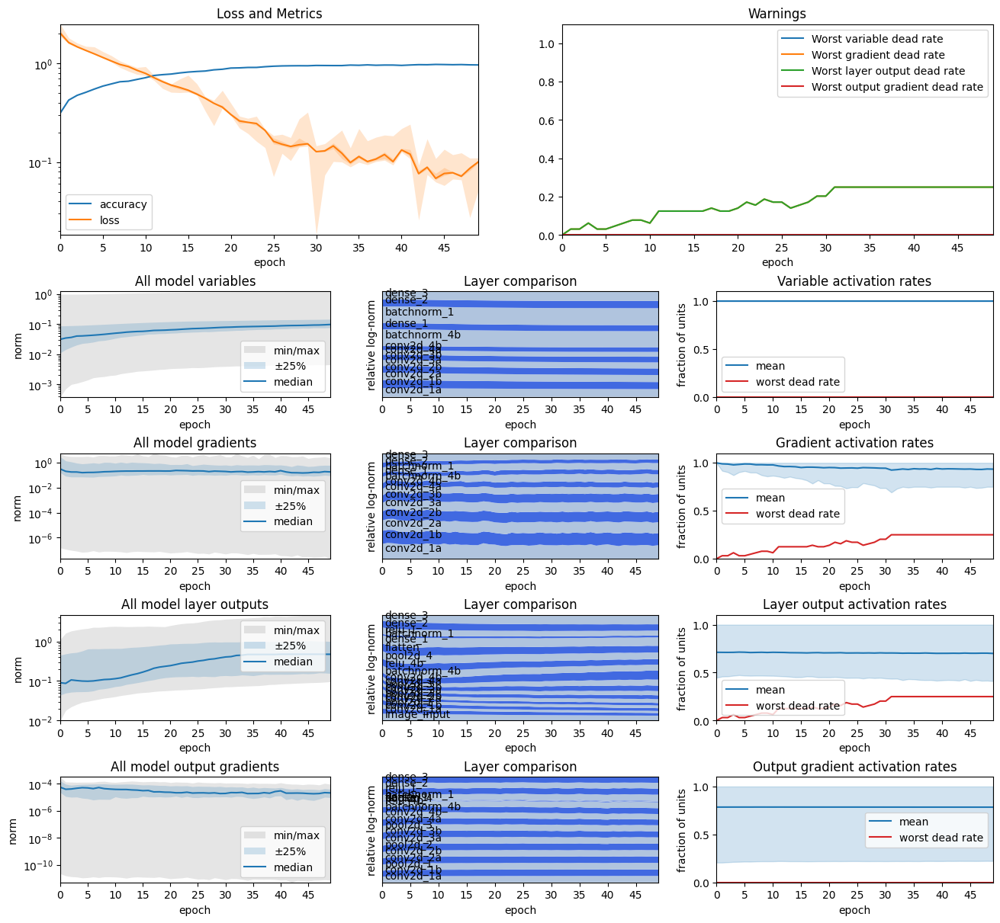

In [49]:
tinstr.plot_history_overview([history, variables, gradients, outputs, output_gradients])

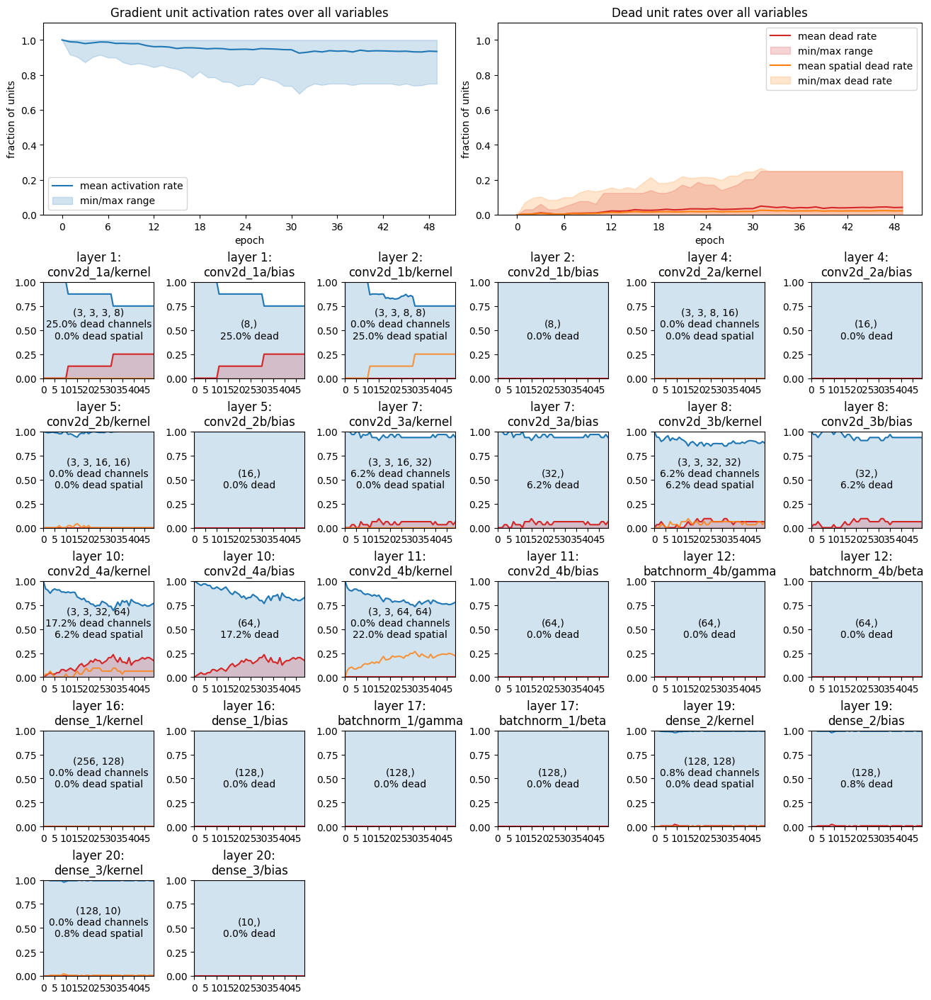

In [50]:
tinstr.plot_activity_history(gradients)

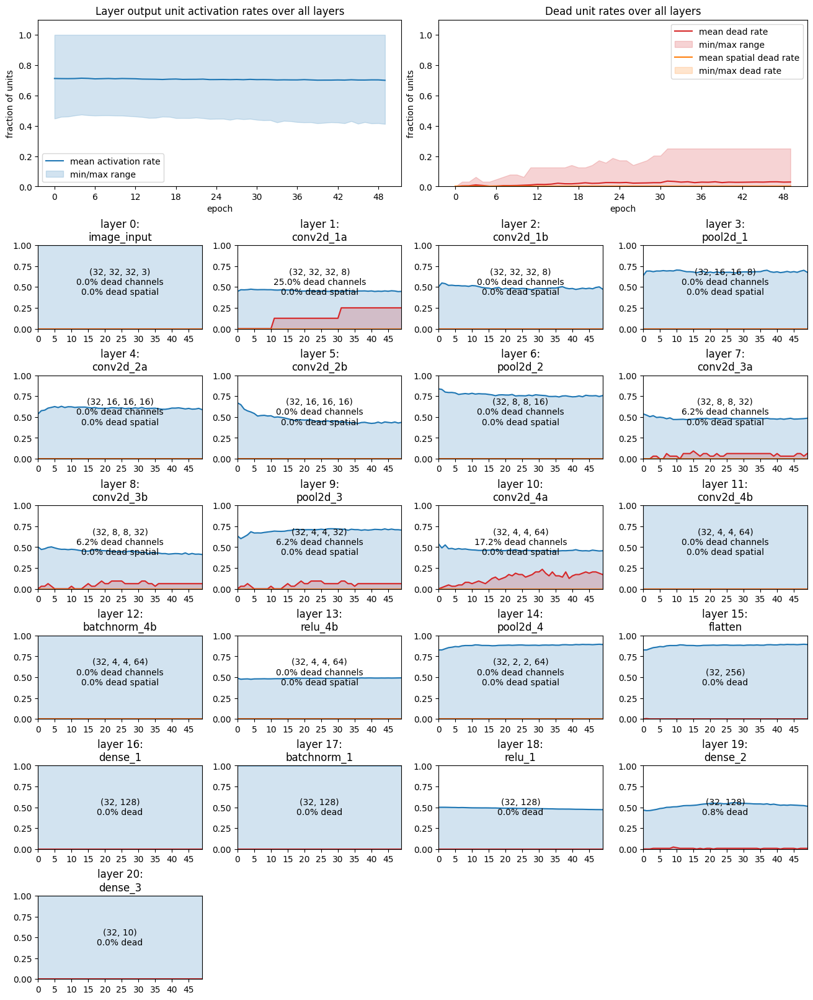

In [51]:
tinstr.plot_activity_history(outputs)

## References
For further reading on the subjects of neuron death and of image alignment, you might like to read some of the following articles.

_All references are listed in reverse chronological order._

### On neuron death

Neuron death, including being "born dead", is directly studied in the following papers:

* Dohare, S., Hernandez-Garcia, J.F., Lan, Q. et al (2024). Loss of plasticity in deep continual learning. Nature, 632, 768–774. https://doi.org/10.1038/s41586-024-07711-7

* Whitaker, T., & Whitley, D. (2023). Synaptic Stripping: How Pruning Can Bring Dead Neurons Back To Life. ArXiv. https://arxiv.org/abs/2302.05818

* Rister, B., & Rubin, D. L. (2020). Probabilistic bounds on neuron death in deep rectifier networks. ArXiv. https://arxiv.org/pdf/2007.06192

* Arnekvist, I., Carvalhlo, J. F., Kragic, D., & Stork, J. A. (2020). The effect of Target Normalization and Momentum on Dying ReLU. ArXiv.
https://arxiv.org/abs/2005.06195

* Shin, Y., & Karniadakis, G. E. (2019). Trainability of ReLU networks and Data-dependent Initialization. ArXiv. https://arxiv.org/abs/1907.09696

* Lu, L., Shin, Y., Su, Y., & Karniadakis, G. E (2019). Dying ReLU and Initialization: Theory and Numerical Examples. ArXiv. https://arxiv.org/abs/1903.06733

* Wu, Y-H., et al, (2018). ANS: Adaptive Network Scaling for Deep Rectifier Reinforcement Learning Models. ArXiv. https://arxiv.org/abs/1809.02112

Neuron death was not directly discussed, but many potential problems of ReLU activation functions were discussed in the seminal papers that introduced the initialisation schemes we commonly use today:

* Xu, B., Wang, N., Chen, T., & Li, M. (2015). Empirical Evaluation of Rectified Activations in Convolutional Network. ArXiv. https://arxiv.org/abs/1505.00853

* He, K., Zhang, X., Ren, S., & Sun, J. (2015). Delving Deep into Rectifiers: Surpassing Human-Level Performance on ImageNet Classification. ArXiv. https://arxiv.org/abs/1502.01852

* Glorot, X., & Bengio, Y. (2010). Understanding the difficulty of training deep feedforward neural networks. PMLR 9:256-256. https://proceedings.mlr.press/v9/glorot10a.html


### On Image alignment

* Luo, Y., Wang, X., Liao, Y., Fu, Q., Shu, C., Wu, Y., & He, Y. (2023). A Review of Homography Estimation: Advances and Challenges. Electronics, 12(24), 4977. https://doi.org/10.3390/electronics12244977

* Chen, J., Frey, E. C., He, Y., et al (2021). TransMorph: Transformer for unsupervised medical image registration. Medical Image Analysis (MedIA)
https://arxiv.org/abs/2111.10480 \[[code](https://github.com/junyuchen245/TransMorph_Transformer_for_Medical_Image_Registration)\]

* Shao, R., Wu, G., Zhou, Y., et al (2021). LocalTrans: A Multiscale Local Transformer Network for Cross-Resolution Homography Estimation. ArXiv. https://arxiv.org/abs/2106.04067 \[[code](https://github.com/DSaurus/LocalTrans)\]

* Nowruzi, F.E., Laganiere, R., Japkowicz, N. (2017). Homography Estimation from Image Pairs with Hierarchical Convolutional Networks. IVCC. https://openaccess.thecvf.com/content_ICCV_2017_workshops/papers/w17/Nowruzi_Homography_Estimation_From_ICCV_2017_paper.pdf

* Surmenok, P. (2017). Estimating an Optimal Learning Rate For a Deep Neural Network. KDnuggets. https://www.kdnuggets.com/2017/11/estimating-optimal-learning-rate-deep-neural-network.html

* DeTone, D., Malisiewicz, T., Rabinovich, A (2016). Deep image homography estimation. arXiv. https://arxiv.org/abs/1606.03798

* Liu, R., Lehman, J., Molino, P., et al (2016). An Intriguing Failing of Convolutional Neural Networks and the CoordConv Solution. NeurIPS 2018.
https://arxiv.org/abs/1807.03247v2



